Bug analysis for github issue [Bug fix for first_metric_only on earlystopping](https://github.com/microsoft/LightGBM/pull/2127) .
1. Order of metric list is not fixed even if it is defined by list. So explicitly indicating which metric is used on early stopping.  
metricの並び順が定義順と違うのでこれを調査する。


2. Due to introducing eval_train_metric feature, if the feature is enabled, then the first metric became train score of the metrics, so it does not appropriate for early stopping. So until the specified metrics of validation is coming, skipping to check early stopping in the loop.  
eval_train_metricを導入したことで、trainを見てearly stoppingをしてしまうことになった。これを修正する。


* パラメータ
https://lightgbm.readthedocs.io/en/latest/Parameters.html#metric-parameters




In [1]:
import sys
sys.path = ["/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/"] + sys.path

In [2]:
import traceback
import lightgbm as lgb
import numpy as np
import numpy.random as rd
import pandas as pd
from sklearn.metrics import roc_auc_score, log_loss
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection._search import ParameterGrid

from IPython.display import display


# グラフ描画系
import matplotlib
from matplotlib import font_manager
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import rc

from matplotlib import animation as ani
from IPython.display import Image

plt.rcParams["patch.force_edgecolor"] = True
#rc('text', usetex=True)
from IPython.display import display # Allows the use of display() for DataFrames
import seaborn as sns
sns.set(style="whitegrid", palette="muted", color_codes=True)
sns.set_style("whitegrid", {'grid.linestyle': '--'})
red = sns.xkcd_rgb["light red"]
green = sns.xkcd_rgb["medium green"]
blue = sns.xkcd_rgb["denim blue"]

/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/__init__.py:47: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [3]:
lgb.__file__

'/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/__init__.py'

# Binary Classification

## Load data

In [15]:
def load_data_for_classification():
    rd.seed(123)
    print('Loading data...')
    # load or create your dataset
    df_train = pd.read_csv('../dataset/binary.train', header=None, sep='\t')
    df_test = pd.read_csv('../dataset/binary.test', header=None, sep='\t')

    print("df_train.shape:{}, df_test.shape:{}".format(df_train.shape, df_test.shape))
    display(df_train.head())

    y_train = df_train[0]
    y_test = df_test[0]
    X_train = df_train.drop(0, axis=1)
    X_test = df_test.drop(0, axis=1)
    return X_train, y_train, X_test, y_test

def classification_train(metric_list=None, first_metric_only=True, eval_train_metric=True, num_boost_round=500):
    # create dataset for lightgbm
    lgb_train = lgb.Dataset(X_train, y_train)

    # specify your configurations as a dict
    params = {
        'boosting_type': 'gbdt',
        'objective': 'binary',
        'metric': metric_list,
        #'metric': ['auc', 'binary_logloss',],
        'num_leaves': 8,
        'learning_rate': 0.1,
        'feature_fraction': 0.8,
        'bagging_fraction': 0.8,
        'bagging_freq': 5,
        'verbose': 0
    }

    res_dict = {}
    callbacks = [
        lgb.early_stopping(stopping_rounds=100, first_metric_only=first_metric_only, verbose=True),
        #lgb.record_evaluation(res_dict)
    ]

    # Training settings
    FOLD_NUM = 5
    fold_seed = 71
    folds = StratifiedKFold(n_splits=FOLD_NUM, shuffle=True, random_state=fold_seed)

    # Fitting
    ret = lgb.cv(params=params,
                   train_set=lgb_train,
                   folds=folds,
                   num_boost_round=num_boost_round,
                   verbose_eval = 50,
                   callbacks=callbacks, 
                   eval_train_metric=eval_train_metric,
                   # return_boosters=True
                   )

    #print(f"best_iteration : {model.best_iteration}")
    df_ret = pd.DataFrame(ret)
    display(df_ret.tail())
    return df_ret

def draw_metric_graph(df_ret):
    valid_cols = [c for c in df_ret.columns if c.find("valid")>=0 and c.find("mean")>=0]
    train_cols = [c for c in df_ret.columns if c.find("train")>=0 and c.find("mean")>=0]
    
    if len(valid_cols)==0:
        valid_cols = [c for c in df_ret.columns if c.find("mean")>=0]

    n_graph = len(valid_cols) + len(train_cols)
    n_cols = 3
    n_rows = n_graph//n_cols+1

    plt.figure(figsize=(25, 5*n_rows))
    cnt = 1
    for c in valid_cols:
        plt.subplot(n_rows, n_cols, cnt); cnt += 1
        df_ret[c].plot()
        plt.title(f"{c}")
        # plt.show()


    for c in train_cols:
        plt.subplot(n_rows, n_cols, cnt); cnt += 1
        df_ret[c].plot()
        plt.title(f"{c}")
        #plt.show()
    plt.tight_layout()
    plt.show()

In [5]:
# TODO: combination of metrics set
# 

from itertools import permutations
two_metrics = list(permutations(['binary_logloss','auc', ], 2))
three_metrics = list(permutations(['binary_logloss','auc', "xentropy"], 3))

param_grid = {
#        "metric_list" : [two_metrics[0]], 
    "metric_list" : two_metrics + three_metrics + [
                      None, "", "None", "binary_logloss", "auc", "xentropy",  # just one metric
                    ] , 
    #"metric_list" : [""], 
    "first_metric_only": [True, False],
    "eval_train_metric": [True, False],
}
pg = ParameterGrid(param_grid)

In [6]:
X_train, y_train, X_test, y_test = load_data_for_classification()

Loading data...
df_train.shape:(7000, 29), df_test.shape:(500, 29)


,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,1,0.869,-0.635,0.226,0.327,-0.690,0.754,-0.249,-1.092,0.000,...,-0.010,-0.046,3.102,1.354,0.980,0.978,0.920,0.722,0.989,0.877
1,1,0.908,0.329,0.359,1.498,-0.313,1.096,-0.558,-1.588,2.173,...,-1.139,-0.001,0.000,0.302,0.833,0.986,0.978,0.780,0.992,0.798
2,1,0.799,1.471,-1.636,0.454,0.426,1.105,1.282,1.382,0.000,...,1.129,0.900,0.000,0.910,1.108,0.986,0.951,0.803,0.866,0.780
3,0,1.344,-0.877,0.936,1.992,0.882,1.786,-1.647,-0.942,0.000,...,-0.678,-1.360,0.000,0.947,1.029,0.999,0.728,0.869,1.027,0.958
4,1,1.105,0.321,1.522,0.883,-1.205,0.681,-1.070,-0.922,0.000,...,-0.374,0.113,0.000,0.756,1.361,0.987,0.838,1.133,0.872,0.808


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('binary_logloss', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's valid binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's train auc: 0.911222 + 0.00182659	cv_agg's train binary_logloss: 0.42645 + 0.00158453	cv_agg's valid auc: 0.769132 + 0.0107175	cv_agg's valid binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's train auc: 0.86

,train auc-mean,train auc-stdv,train binary_logloss-mean,train binary_logloss-stdv,valid auc-mean,valid auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
99,0.861688,0.002259,0.489460,0.002139,0.773914,0.012689,0.567869,0.009902
100,0.862317,0.002210,0.488741,0.002174,0.773939,0.012767,0.567898,0.009931
101,0.862821,0.002213,0.488106,0.002191,0.773867,0.012762,0.567922,0.009937
102,0.863465,0.002138,0.487379,0.002094,0.773908,0.012827,0.567912,0.009919
103,0.864025,0.002097,0.486689,0.002089,0.774163,0.012813,0.567659,0.009976


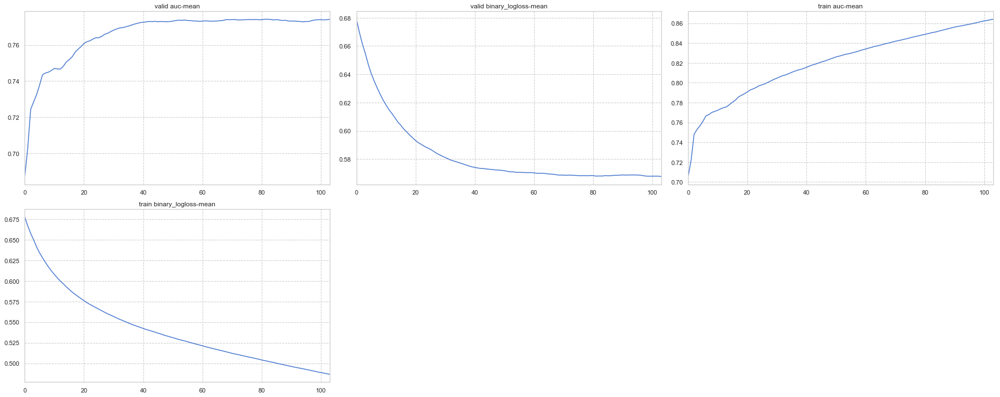


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('auc', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg's valid auc: 0.77113 + 0.0116124
Early stopping, best iteration is:
[82]	cv_agg's train binary_logloss: 0.503292 + 0.00202494	cv_agg's train auc: 0.849456 + 0.00249654	cv_agg's valid binary_logloss: 0.567977 + 0.0102463	cv_agg's valid auc: 0.774197 + 0.0137751
metric_key:valid auc


,train binary_logloss-mean,train binary_logloss-stdv,train auc-mean,train auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid auc-mean,valid auc-stdv
77,0.506604,0.001793,0.846830,0.002407,0.568303,0.010992,0.773952,0.014784
78,0.505829,0.001881,0.847386,0.002383,0.568192,0.010609,0.774053,0.014320
79,0.505010,0.001906,0.848161,0.002385,0.568357,0.010661,0.773936,0.014322
80,0.504091,0.002040,0.848802,0.002513,0.568247,0.010199,0.773933,0.013769
81,0.503292,0.002025,0.849456,0.002497,0.567977,0.010246,0.774197,0.013775


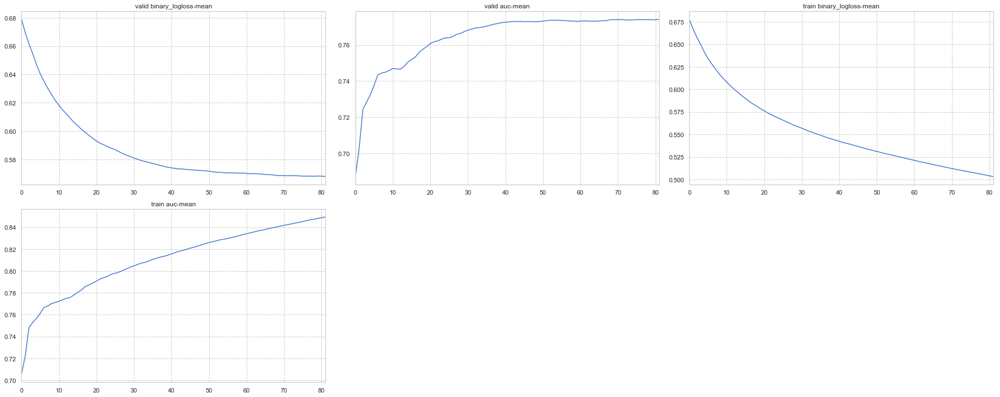


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('binary_logloss', 'auc', 'xentropy')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid xentropy: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid xentropy: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid xentropy: 0.569961 + 0.00967098	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's valid bina

,train xentropy-mean,train xentropy-stdv,train auc-mean,train auc-stdv,train binary_logloss-mean,train binary_logloss-stdv,valid xentropy-mean,valid xentropy-stdv,valid auc-mean,valid auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
99,0.489460,0.002139,0.861688,0.002259,0.489460,0.002139,0.567869,0.009902,0.773914,0.012689,0.567869,0.009902
100,0.488741,0.002174,0.862317,0.002210,0.488741,0.002174,0.567898,0.009931,0.773939,0.012767,0.567898,0.009931
101,0.488106,0.002191,0.862821,0.002213,0.488106,0.002191,0.567922,0.009937,0.773867,0.012762,0.567922,0.009937
102,0.487379,0.002094,0.863465,0.002138,0.487379,0.002094,0.567912,0.009919,0.773908,0.012827,0.567912,0.009919
103,0.486689,0.002089,0.864025,0.002097,0.486689,0.002089,0.567659,0.009976,0.774163,0.012813,0.567659,0.009976


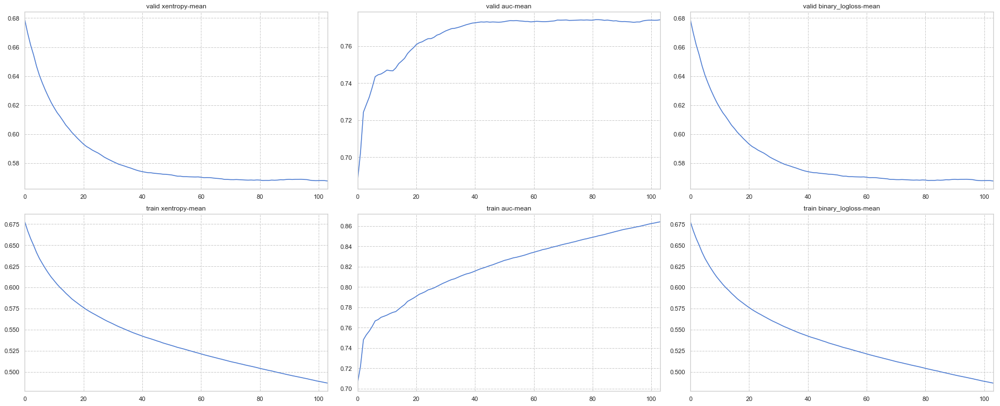


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('binary_logloss', 'xentropy', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid xentropy: 0.572024 + 0.0108773	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid xentropy: 0.567869 + 0.00990152	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's valid xentropy: 0.569961 + 0.00967098	cv_agg's valid bina

,train auc-mean,train auc-stdv,train xentropy-mean,train xentropy-stdv,train binary_logloss-mean,train binary_logloss-stdv,valid auc-mean,valid auc-stdv,valid xentropy-mean,valid xentropy-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
99,0.861688,0.002259,0.489460,0.002139,0.489460,0.002139,0.773914,0.012689,0.567869,0.009902,0.567869,0.009902
100,0.862317,0.002210,0.488741,0.002174,0.488741,0.002174,0.773939,0.012767,0.567898,0.009931,0.567898,0.009931
101,0.862821,0.002213,0.488106,0.002191,0.488106,0.002191,0.773867,0.012762,0.567922,0.009937,0.567922,0.009937
102,0.863465,0.002138,0.487379,0.002094,0.487379,0.002094,0.773908,0.012827,0.567912,0.009919,0.567912,0.009919
103,0.864025,0.002097,0.486689,0.002089,0.486689,0.002089,0.774163,0.012813,0.567659,0.009976,0.567659,0.009976


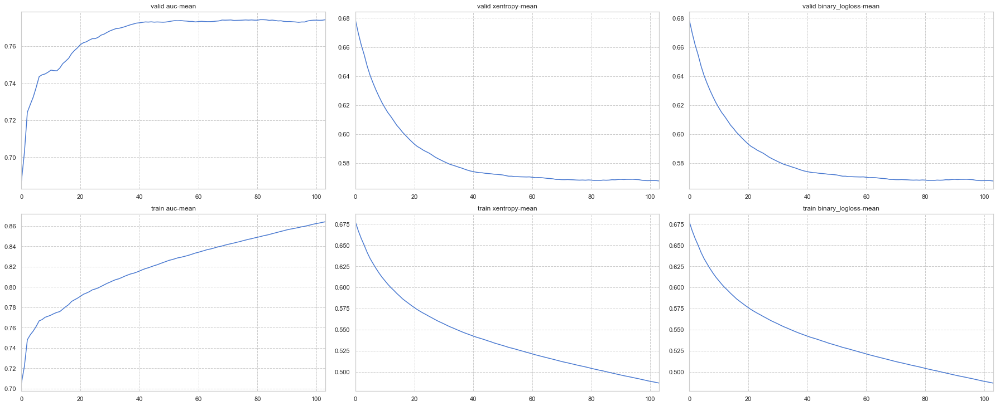


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('auc', 'binary_logloss', 'xentropy')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's valid xentropy: 0.572024 + 0.0108773	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191
[100]	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's valid xentropy: 0.567869 + 0.00990152	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889
[150]	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's valid xentropy: 0.569961 + 0.00967098	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg

,train xentropy-mean,train xentropy-stdv,train binary_logloss-mean,train binary_logloss-stdv,train auc-mean,train auc-stdv,valid xentropy-mean,valid xentropy-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid auc-mean,valid auc-stdv
77,0.506604,0.001793,0.506604,0.001793,0.846830,0.002407,0.568303,0.010992,0.568303,0.010992,0.773952,0.014784
78,0.505829,0.001881,0.505829,0.001881,0.847386,0.002383,0.568192,0.010609,0.568192,0.010609,0.774053,0.014320
79,0.505010,0.001906,0.505010,0.001906,0.848161,0.002385,0.568357,0.010661,0.568357,0.010661,0.773936,0.014322
80,0.504091,0.002040,0.504091,0.002040,0.848802,0.002513,0.568247,0.010199,0.568247,0.010199,0.773933,0.013769
81,0.503292,0.002025,0.503292,0.002025,0.849456,0.002497,0.567977,0.010246,0.567977,0.010246,0.774197,0.013775


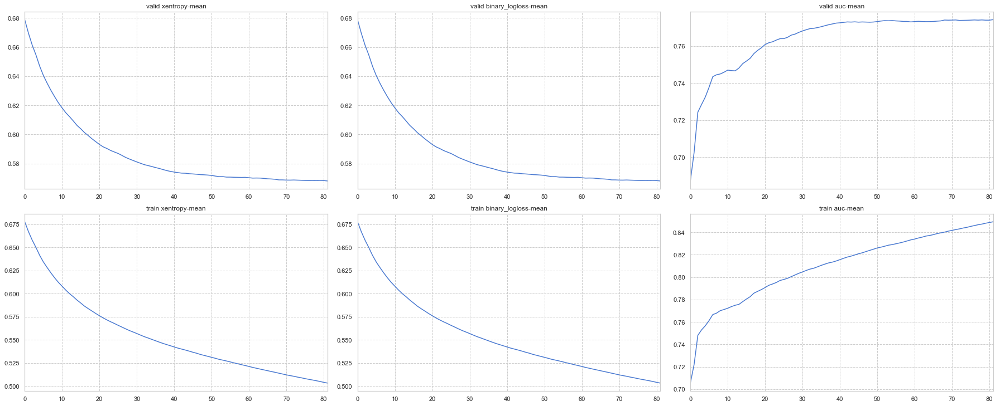


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('auc', 'xentropy', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid xentropy: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid xentropy: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg's valid xentropy: 0.569961 + 0.00967098	cv_agg

,train binary_logloss-mean,train binary_logloss-stdv,train xentropy-mean,train xentropy-stdv,train auc-mean,train auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid xentropy-mean,valid xentropy-stdv,valid auc-mean,valid auc-stdv
77,0.506604,0.001793,0.506604,0.001793,0.846830,0.002407,0.568303,0.010992,0.568303,0.010992,0.773952,0.014784
78,0.505829,0.001881,0.505829,0.001881,0.847386,0.002383,0.568192,0.010609,0.568192,0.010609,0.774053,0.014320
79,0.505010,0.001906,0.505010,0.001906,0.848161,0.002385,0.568357,0.010661,0.568357,0.010661,0.773936,0.014322
80,0.504091,0.002040,0.504091,0.002040,0.848802,0.002513,0.568247,0.010199,0.568247,0.010199,0.773933,0.013769
81,0.503292,0.002025,0.503292,0.002025,0.849456,0.002497,0.567977,0.010246,0.567977,0.010246,0.774197,0.013775


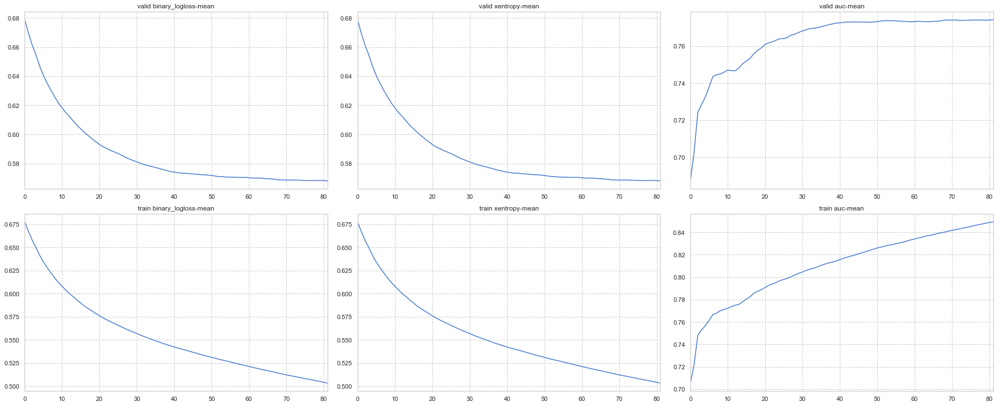


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('xentropy', 'binary_logloss', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid xentropy: 0.572024 + 0.0108773
[100]	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid xentropy: 0.567869 + 0.00990152
[150]	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg's vali

,train auc-mean,train auc-stdv,train binary_logloss-mean,train binary_logloss-stdv,train xentropy-mean,train xentropy-stdv,valid auc-mean,valid auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid xentropy-mean,valid xentropy-stdv
99,0.861688,0.002259,0.489460,0.002139,0.489460,0.002139,0.773914,0.012689,0.567869,0.009902,0.567869,0.009902
100,0.862317,0.002210,0.488741,0.002174,0.488741,0.002174,0.773939,0.012767,0.567898,0.009931,0.567898,0.009931
101,0.862821,0.002213,0.488106,0.002191,0.488106,0.002191,0.773867,0.012762,0.567922,0.009937,0.567922,0.009937
102,0.863465,0.002138,0.487379,0.002094,0.487379,0.002094,0.773908,0.012827,0.567912,0.009919,0.567912,0.009919
103,0.864025,0.002097,0.486689,0.002089,0.486689,0.002089,0.774163,0.012813,0.567659,0.009976,0.567659,0.009976


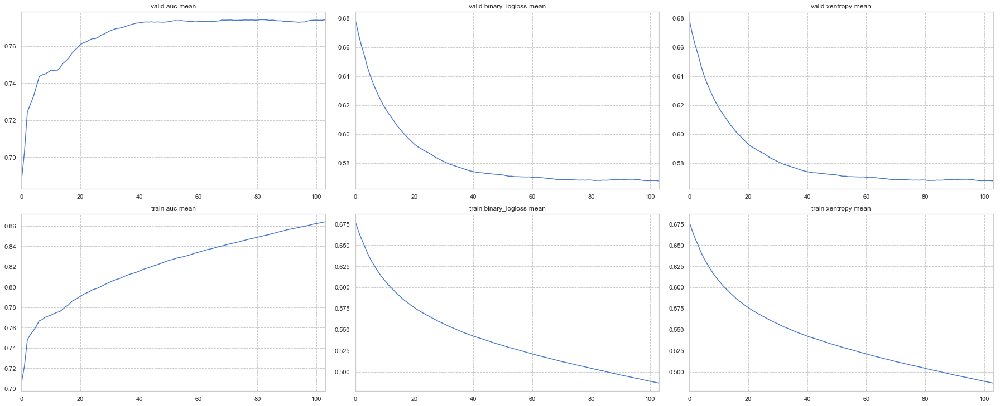


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('xentropy', 'auc', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid xentropy: 0.572024 + 0.0108773
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid xentropy: 0.567869 + 0.00990152
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's vali

,train binary_logloss-mean,train binary_logloss-stdv,train auc-mean,train auc-stdv,train xentropy-mean,train xentropy-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid auc-mean,valid auc-stdv,valid xentropy-mean,valid xentropy-stdv
99,0.489460,0.002139,0.861688,0.002259,0.489460,0.002139,0.567869,0.009902,0.773914,0.012689,0.567869,0.009902
100,0.488741,0.002174,0.862317,0.002210,0.488741,0.002174,0.567898,0.009931,0.773939,0.012767,0.567898,0.009931
101,0.488106,0.002191,0.862821,0.002213,0.488106,0.002191,0.567922,0.009937,0.773867,0.012762,0.567922,0.009937
102,0.487379,0.002094,0.863465,0.002138,0.487379,0.002094,0.567912,0.009919,0.773908,0.012827,0.567912,0.009919
103,0.486689,0.002089,0.864025,0.002097,0.486689,0.002089,0.567659,0.009976,0.774163,0.012813,0.567659,0.009976


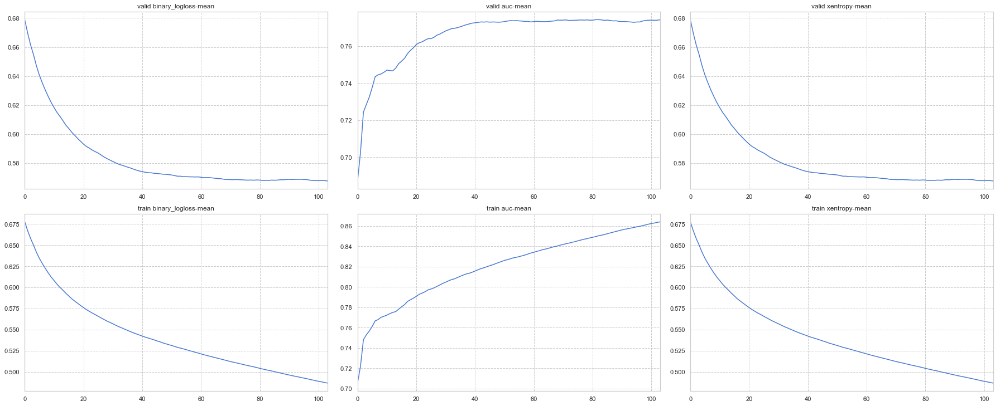


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.

{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-9-59db3dd0020c>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-4-6ad403308e40>", line 53, in classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 228, in _callback
    raise LightGBMError("`metric` should be specified if first_metric_only==True.")
lightgbm.basic.LightGBMError: `metric` should be specified if first_metric_only==True.


[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's train binary_logloss: 0.42645 + 0.00158453	cv_agg's valid binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's train binary_logloss: 0.486689 + 0.00208938	cv_agg's valid binary_logloss: 0.567659 + 0.00997623
metric_key:valid binary_logloss


,train binary_logloss-mean,train binary_logloss-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
99,0.489460,0.002139,0.567869,0.009902
100,0.488741,0.002174,0.567898,0.009931
101,0.488106,0.002191,0.567922,0.009937
102,0.487379,0.002094,0.567912,0.009919
103,0.486689,0.002089,0.567659,0.009976


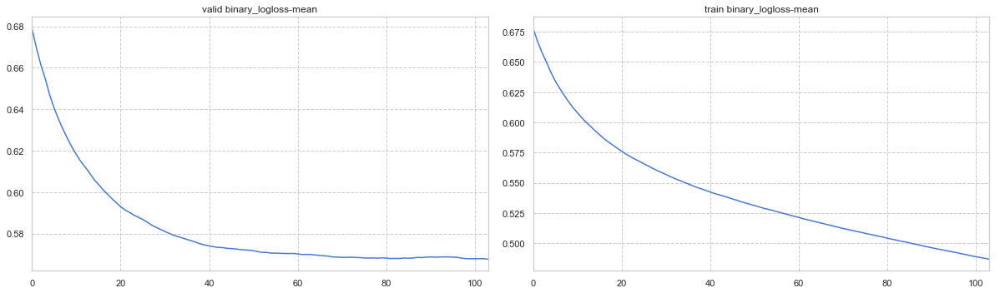


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'None'}

{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'binary_logloss'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-9-59db3dd0020c>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-4-6ad403308e40>", line 53, in classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's train binary_logloss: 0.42645 + 0.00158453	cv_agg's valid binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's train binary_logloss: 0.486689 + 0.00208938	cv_agg's valid binary_logloss: 0.567659 + 0.00997623
metric_key:valid binary_logloss


,train binary_logloss-mean,train binary_logloss-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
99,0.489460,0.002139,0.567869,0.009902
100,0.488741,0.002174,0.567898,0.009931
101,0.488106,0.002191,0.567922,0.009937
102,0.487379,0.002094,0.567912,0.009919
103,0.486689,0.002089,0.567659,0.009976


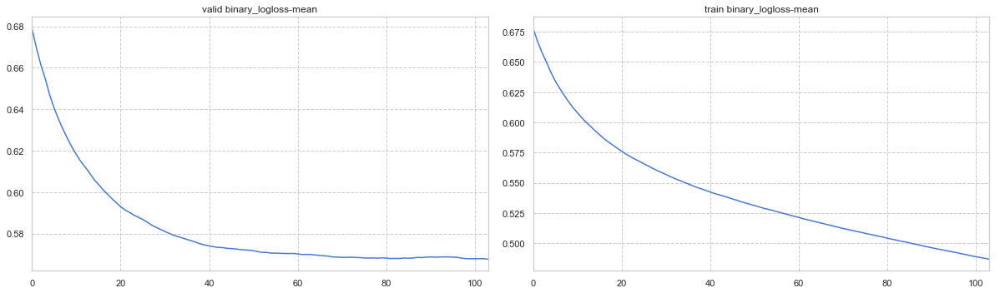


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'auc'}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's valid auc: 0.772933 + 0.0160191
[100]	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's valid auc: 0.773914 + 0.0126889
[150]	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's valid auc: 0.77113 + 0.0116124
Early stopping, best iteration is:
[82]	cv_agg's train auc: 0.849456 + 0.00249654	cv_agg's valid auc: 0.774197 + 0.0137751
metric_key:valid auc


,train auc-mean,train auc-stdv,valid auc-mean,valid auc-stdv
77,0.846830,0.002407,0.773952,0.014784
78,0.847386,0.002383,0.774053,0.014320
79,0.848161,0.002385,0.773936,0.014322
80,0.848802,0.002513,0.773933,0.013769
81,0.849456,0.002497,0.774197,0.013775


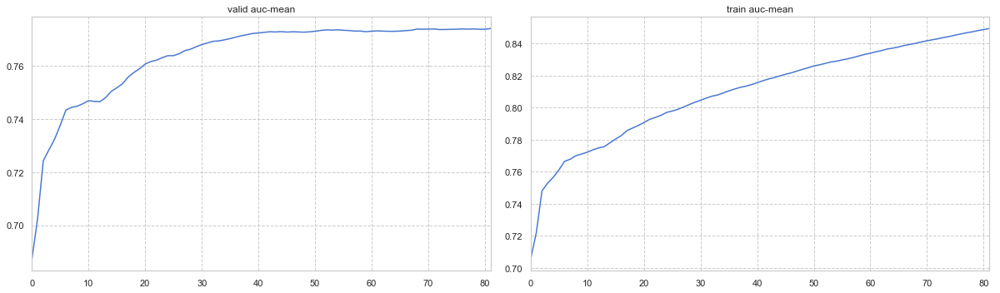


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'xentropy'}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's valid xentropy: 0.572024 + 0.0108773
[100]	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's valid xentropy: 0.567869 + 0.00990152
[150]	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's valid xentropy: 0.569961 + 0.00967098
[200]	cv_agg's train xentropy: 0.42645 + 0.00158453	cv_agg's valid xentropy: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's train xentropy: 0.486689 + 0.00208938	cv_agg's valid xentropy: 0.567659 + 0.00997623
metric_key:valid xentropy


,train xentropy-mean,train xentropy-stdv,valid xentropy-mean,valid xentropy-stdv
99,0.489460,0.002139,0.567869,0.009902
100,0.488741,0.002174,0.567898,0.009931
101,0.488106,0.002191,0.567922,0.009937
102,0.487379,0.002094,0.567912,0.009919
103,0.486689,0.002089,0.567659,0.009976


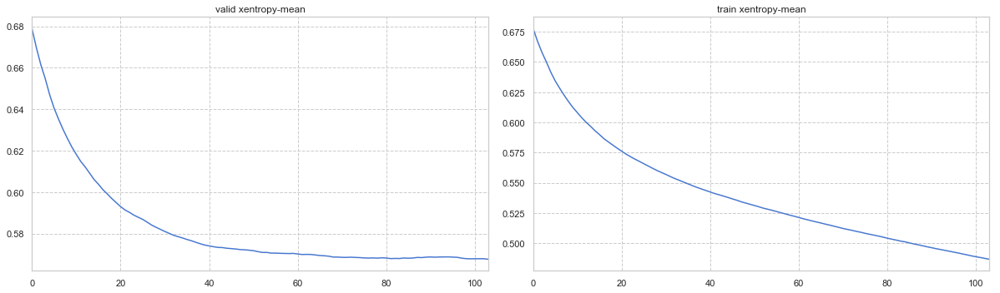


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('binary_logloss', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's valid binary_logloss: 0.569961 + 0.00967098
Early stopping, best iteration is:
[82]	cv_agg's train auc: 0.849456 + 0.00249654	cv_agg's train binary_logloss: 0.503292 + 0.00202494	cv_agg's valid auc: 0.774197 + 0.0137751	cv_agg's valid binary_logloss: 0.567977 + 0.0102463


,train auc-mean,train auc-stdv,train binary_logloss-mean,train binary_logloss-stdv,valid auc-mean,valid auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
77,0.846830,0.002407,0.506604,0.001793,0.773952,0.014784,0.568303,0.010992
78,0.847386,0.002383,0.505829,0.001881,0.774053,0.014320,0.568192,0.010609
79,0.848161,0.002385,0.505010,0.001906,0.773936,0.014322,0.568357,0.010661
80,0.848802,0.002513,0.504091,0.002040,0.773933,0.013769,0.568247,0.010199
81,0.849456,0.002497,0.503292,0.002025,0.774197,0.013775,0.567977,0.010246


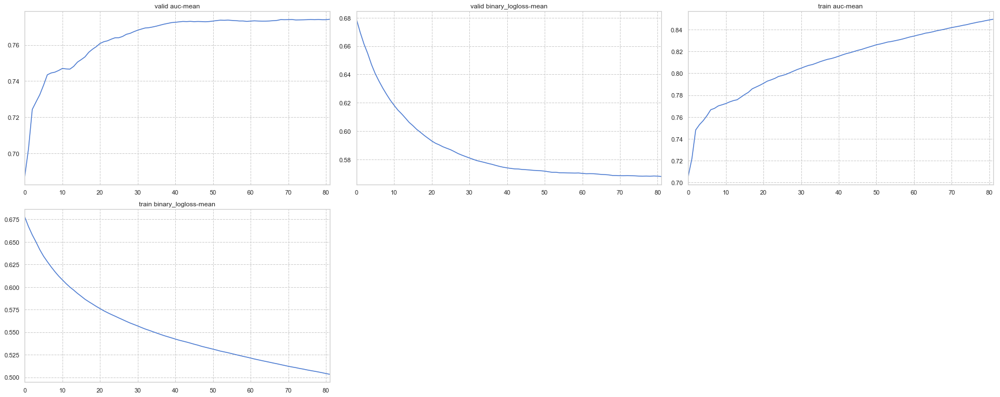


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('auc', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg's valid auc: 0.77113 + 0.0116124
Early stopping, best iteration is:
[82]	cv_agg's train binary_logloss: 0.503292 + 0.00202494	cv_agg's train auc: 0.849456 + 0.00249654	cv_agg's valid binary_logloss: 0.567977 + 0.0102463	cv_agg's valid auc: 0.774197 + 0.0137751


,train binary_logloss-mean,train binary_logloss-stdv,train auc-mean,train auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid auc-mean,valid auc-stdv
77,0.506604,0.001793,0.846830,0.002407,0.568303,0.010992,0.773952,0.014784
78,0.505829,0.001881,0.847386,0.002383,0.568192,0.010609,0.774053,0.014320
79,0.505010,0.001906,0.848161,0.002385,0.568357,0.010661,0.773936,0.014322
80,0.504091,0.002040,0.848802,0.002513,0.568247,0.010199,0.773933,0.013769
81,0.503292,0.002025,0.849456,0.002497,0.567977,0.010246,0.774197,0.013775


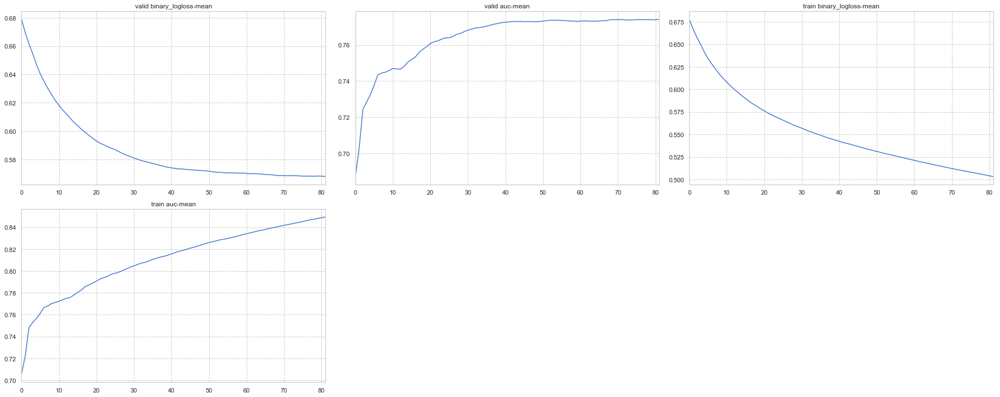


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('binary_logloss', 'auc', 'xentropy')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid xentropy: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid xentropy: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid xentropy: 0.569961 + 0.00967098	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's valid bin

,train xentropy-mean,train xentropy-stdv,train auc-mean,train auc-stdv,train binary_logloss-mean,train binary_logloss-stdv,valid xentropy-mean,valid xentropy-stdv,valid auc-mean,valid auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
77,0.506604,0.001793,0.846830,0.002407,0.506604,0.001793,0.568303,0.010992,0.773952,0.014784,0.568303,0.010992
78,0.505829,0.001881,0.847386,0.002383,0.505829,0.001881,0.568192,0.010609,0.774053,0.014320,0.568192,0.010609
79,0.505010,0.001906,0.848161,0.002385,0.505010,0.001906,0.568357,0.010661,0.773936,0.014322,0.568357,0.010661
80,0.504091,0.002040,0.848802,0.002513,0.504091,0.002040,0.568247,0.010199,0.773933,0.013769,0.568247,0.010199
81,0.503292,0.002025,0.849456,0.002497,0.503292,0.002025,0.567977,0.010246,0.774197,0.013775,0.567977,0.010246


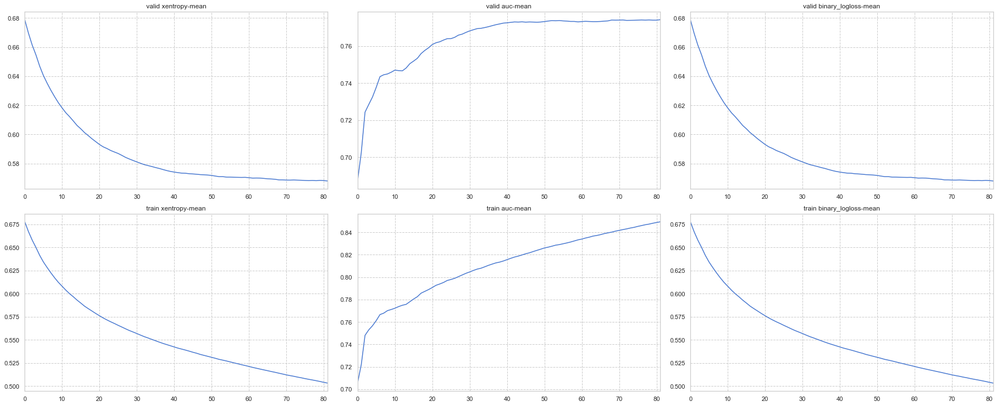


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('binary_logloss', 'xentropy', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid xentropy: 0.572024 + 0.0108773	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid xentropy: 0.567869 + 0.00990152	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's valid xentropy: 0.569961 + 0.00967098	cv_agg's valid bin

,train auc-mean,train auc-stdv,train xentropy-mean,train xentropy-stdv,train binary_logloss-mean,train binary_logloss-stdv,valid auc-mean,valid auc-stdv,valid xentropy-mean,valid xentropy-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
77,0.846830,0.002407,0.506604,0.001793,0.506604,0.001793,0.773952,0.014784,0.568303,0.010992,0.568303,0.010992
78,0.847386,0.002383,0.505829,0.001881,0.505829,0.001881,0.774053,0.014320,0.568192,0.010609,0.568192,0.010609
79,0.848161,0.002385,0.505010,0.001906,0.505010,0.001906,0.773936,0.014322,0.568357,0.010661,0.568357,0.010661
80,0.848802,0.002513,0.504091,0.002040,0.504091,0.002040,0.773933,0.013769,0.568247,0.010199,0.568247,0.010199
81,0.849456,0.002497,0.503292,0.002025,0.503292,0.002025,0.774197,0.013775,0.567977,0.010246,0.567977,0.010246


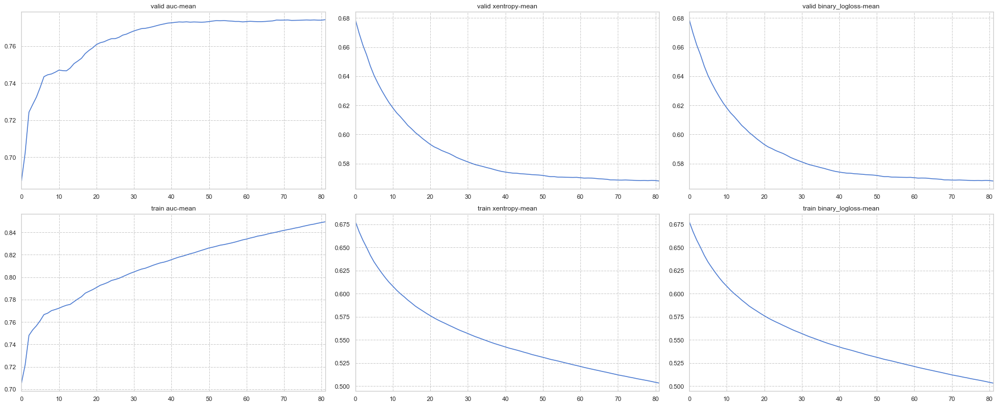


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('auc', 'binary_logloss', 'xentropy')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's valid xentropy: 0.572024 + 0.0108773	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191
[100]	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's valid xentropy: 0.567869 + 0.00990152	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889
[150]	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's valid xentropy: 0.569961 + 0.00967098	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_ag

,train xentropy-mean,train xentropy-stdv,train binary_logloss-mean,train binary_logloss-stdv,train auc-mean,train auc-stdv,valid xentropy-mean,valid xentropy-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid auc-mean,valid auc-stdv
77,0.506604,0.001793,0.506604,0.001793,0.846830,0.002407,0.568303,0.010992,0.568303,0.010992,0.773952,0.014784
78,0.505829,0.001881,0.505829,0.001881,0.847386,0.002383,0.568192,0.010609,0.568192,0.010609,0.774053,0.014320
79,0.505010,0.001906,0.505010,0.001906,0.848161,0.002385,0.568357,0.010661,0.568357,0.010661,0.773936,0.014322
80,0.504091,0.002040,0.504091,0.002040,0.848802,0.002513,0.568247,0.010199,0.568247,0.010199,0.773933,0.013769
81,0.503292,0.002025,0.503292,0.002025,0.849456,0.002497,0.567977,0.010246,0.567977,0.010246,0.774197,0.013775


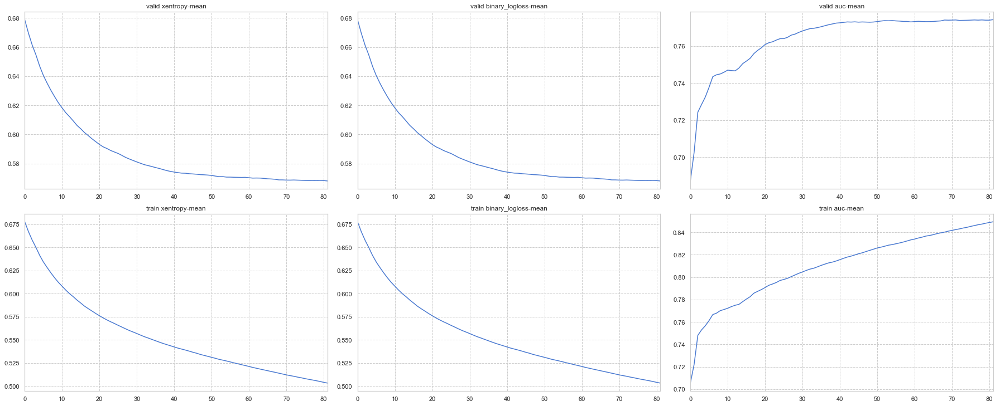


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('auc', 'xentropy', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid xentropy: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid xentropy: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg's valid xentropy: 0.569961 + 0.00967098	cv_ag

,train binary_logloss-mean,train binary_logloss-stdv,train xentropy-mean,train xentropy-stdv,train auc-mean,train auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid xentropy-mean,valid xentropy-stdv,valid auc-mean,valid auc-stdv
77,0.506604,0.001793,0.506604,0.001793,0.846830,0.002407,0.568303,0.010992,0.568303,0.010992,0.773952,0.014784
78,0.505829,0.001881,0.505829,0.001881,0.847386,0.002383,0.568192,0.010609,0.568192,0.010609,0.774053,0.014320
79,0.505010,0.001906,0.505010,0.001906,0.848161,0.002385,0.568357,0.010661,0.568357,0.010661,0.773936,0.014322
80,0.504091,0.002040,0.504091,0.002040,0.848802,0.002513,0.568247,0.010199,0.568247,0.010199,0.773933,0.013769
81,0.503292,0.002025,0.503292,0.002025,0.849456,0.002497,0.567977,0.010246,0.567977,0.010246,0.774197,0.013775


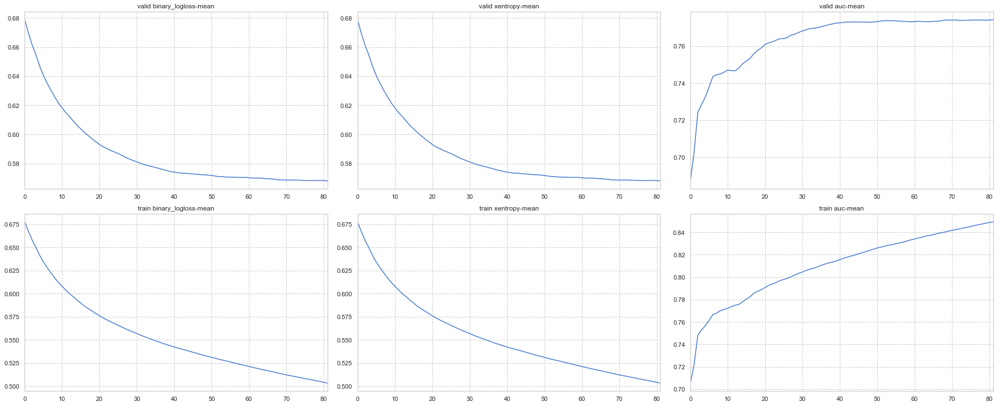


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('xentropy', 'binary_logloss', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid xentropy: 0.572024 + 0.0108773
[100]	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid xentropy: 0.567869 + 0.00990152
[150]	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg's val

,train auc-mean,train auc-stdv,train binary_logloss-mean,train binary_logloss-stdv,train xentropy-mean,train xentropy-stdv,valid auc-mean,valid auc-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid xentropy-mean,valid xentropy-stdv
77,0.846830,0.002407,0.506604,0.001793,0.506604,0.001793,0.773952,0.014784,0.568303,0.010992,0.568303,0.010992
78,0.847386,0.002383,0.505829,0.001881,0.505829,0.001881,0.774053,0.014320,0.568192,0.010609,0.568192,0.010609
79,0.848161,0.002385,0.505010,0.001906,0.505010,0.001906,0.773936,0.014322,0.568357,0.010661,0.568357,0.010661
80,0.848802,0.002513,0.504091,0.002040,0.504091,0.002040,0.773933,0.013769,0.568247,0.010199,0.568247,0.010199
81,0.849456,0.002497,0.503292,0.002025,0.503292,0.002025,0.774197,0.013775,0.567977,0.010246,0.567977,0.010246


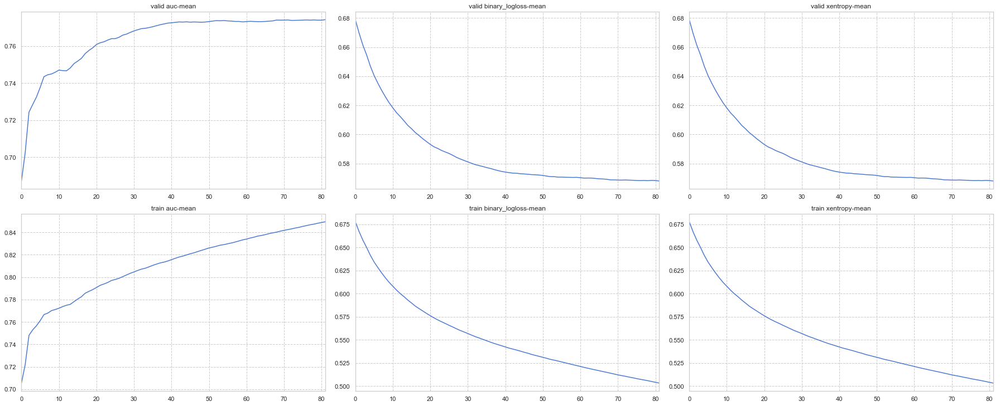


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('xentropy', 'auc', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's valid binary_logloss: 0.572024 + 0.0108773	cv_agg's valid auc: 0.772933 + 0.0160191	cv_agg's valid xentropy: 0.572024 + 0.0108773
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's valid binary_logloss: 0.567869 + 0.00990152	cv_agg's valid auc: 0.773914 + 0.0126889	cv_agg's valid xentropy: 0.567869 + 0.00990152
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's valid binary_logloss: 0.569961 + 0.00967098	cv_agg's valid auc: 0.77113 + 0.0116124	cv_agg's val

,train binary_logloss-mean,train binary_logloss-stdv,train auc-mean,train auc-stdv,train xentropy-mean,train xentropy-stdv,valid binary_logloss-mean,valid binary_logloss-stdv,valid auc-mean,valid auc-stdv,valid xentropy-mean,valid xentropy-stdv
77,0.506604,0.001793,0.846830,0.002407,0.506604,0.001793,0.568303,0.010992,0.773952,0.014784,0.568303,0.010992
78,0.505829,0.001881,0.847386,0.002383,0.505829,0.001881,0.568192,0.010609,0.774053,0.014320,0.568192,0.010609
79,0.505010,0.001906,0.848161,0.002385,0.505010,0.001906,0.568357,0.010661,0.773936,0.014322,0.568357,0.010661
80,0.504091,0.002040,0.848802,0.002513,0.504091,0.002040,0.568247,0.010199,0.773933,0.013769,0.568247,0.010199
81,0.503292,0.002025,0.849456,0.002497,0.503292,0.002025,0.567977,0.010246,0.774197,0.013775,0.567977,0.010246


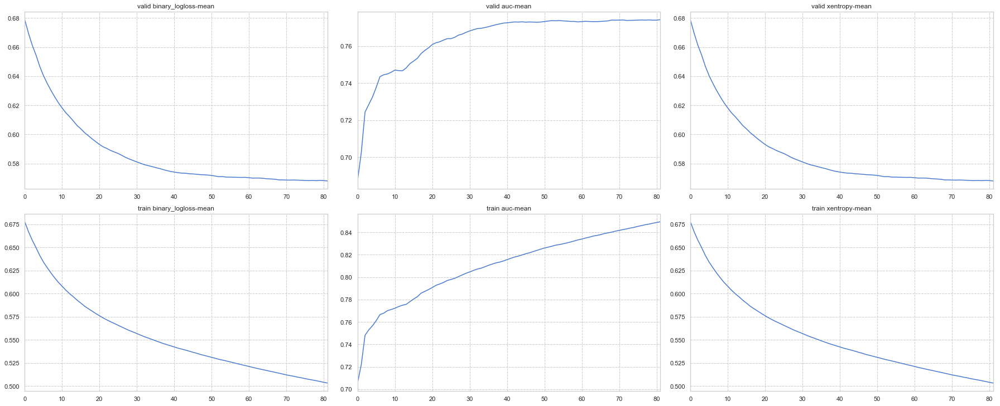


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's train binary_logloss: 0.42645 + 0.00158453	cv_agg's valid binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's train binary_logloss: 0.486689 + 0.00208938	cv_agg's valid binary_logloss: 0.567659 + 0.00997623


,train binary_logloss-mean,train binary_logloss-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
99,0.489460,0.002139,0.567869,0.009902
100,0.488741,0.002174,0.567898,0.009931
101,0.488106,0.002191,0.567922,0.009937
102,0.487379,0.002094,0.567912,0.009919
103,0.486689,0.002089,0.567659,0.009976


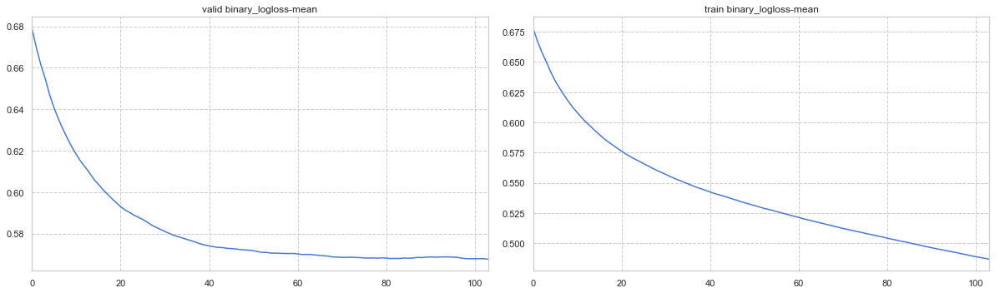


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's train binary_logloss: 0.42645 + 0.00158453	cv_agg's valid binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's train binary_logloss: 0.486689 + 0.00208938	cv_agg's valid binary_logloss: 0.567659 + 0.00997623


,train binary_logloss-mean,train binary_logloss-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
99,0.489460,0.002139,0.567869,0.009902
100,0.488741,0.002174,0.567898,0.009931
101,0.488106,0.002191,0.567922,0.009937
102,0.487379,0.002094,0.567912,0.009919
103,0.486689,0.002089,0.567659,0.009976


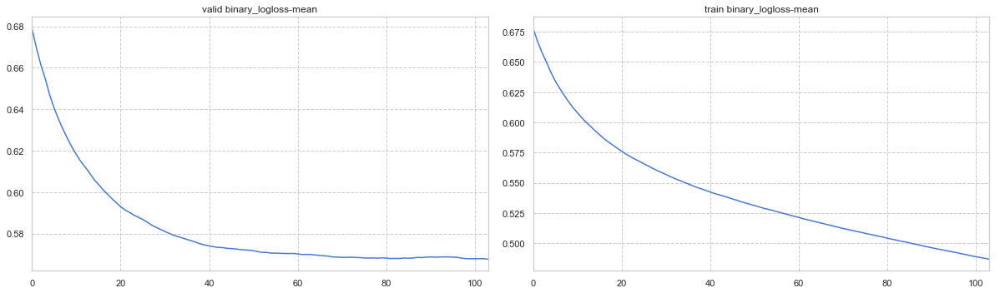


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'None'}

{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'binary_logloss'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-9-59db3dd0020c>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-4-6ad403308e40>", line 53, in classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[50]	cv_agg's train binary_logloss: 0.532171 + 0.00128254	cv_agg's valid binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's train binary_logloss: 0.48946 + 0.00213899	cv_agg's valid binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's train binary_logloss: 0.455745 + 0.00234033	cv_agg's valid binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's train binary_logloss: 0.42645 + 0.00158453	cv_agg's valid binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's train binary_logloss: 0.486689 + 0.00208938	cv_agg's valid binary_logloss: 0.567659 + 0.00997623


,train binary_logloss-mean,train binary_logloss-stdv,valid binary_logloss-mean,valid binary_logloss-stdv
99,0.489460,0.002139,0.567869,0.009902
100,0.488741,0.002174,0.567898,0.009931
101,0.488106,0.002191,0.567922,0.009937
102,0.487379,0.002094,0.567912,0.009919
103,0.486689,0.002089,0.567659,0.009976


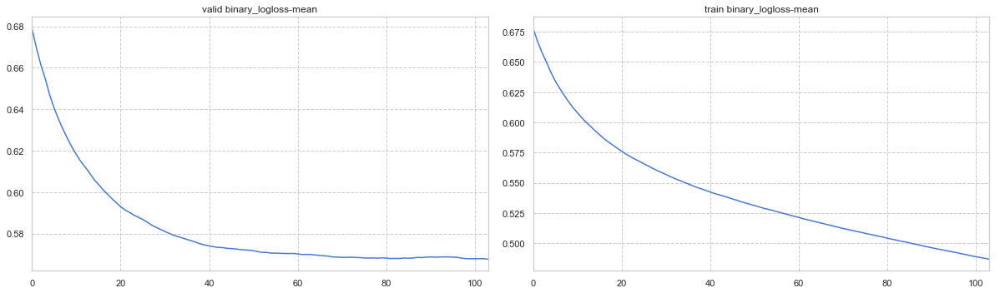


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'auc'}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train auc: 0.824993 + 0.00127279	cv_agg's valid auc: 0.772933 + 0.0160191
[100]	cv_agg's train auc: 0.861688 + 0.00225877	cv_agg's valid auc: 0.773914 + 0.0126889
[150]	cv_agg's train auc: 0.888403 + 0.00201446	cv_agg's valid auc: 0.77113 + 0.0116124
Early stopping, best iteration is:
[82]	cv_agg's train auc: 0.849456 + 0.00249654	cv_agg's valid auc: 0.774197 + 0.0137751


,train auc-mean,train auc-stdv,valid auc-mean,valid auc-stdv
77,0.846830,0.002407,0.773952,0.014784
78,0.847386,0.002383,0.774053,0.014320
79,0.848161,0.002385,0.773936,0.014322
80,0.848802,0.002513,0.773933,0.013769
81,0.849456,0.002497,0.774197,0.013775


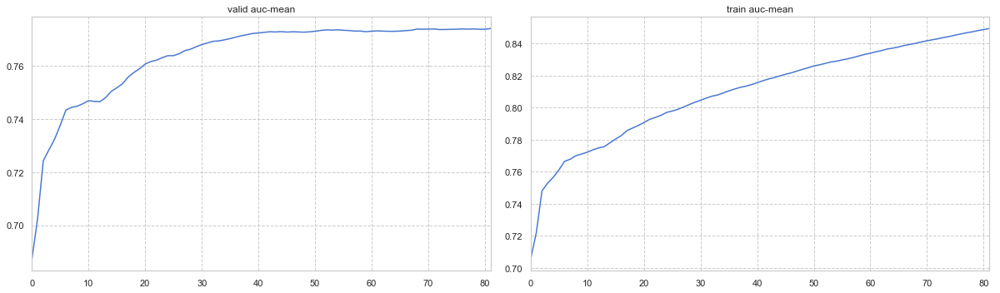


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'xentropy'}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's train xentropy: 0.532171 + 0.00128254	cv_agg's valid xentropy: 0.572024 + 0.0108773
[100]	cv_agg's train xentropy: 0.48946 + 0.00213899	cv_agg's valid xentropy: 0.567869 + 0.00990152
[150]	cv_agg's train xentropy: 0.455745 + 0.00234033	cv_agg's valid xentropy: 0.569961 + 0.00967098
[200]	cv_agg's train xentropy: 0.42645 + 0.00158453	cv_agg's valid xentropy: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's train xentropy: 0.486689 + 0.00208938	cv_agg's valid xentropy: 0.567659 + 0.00997623


,train xentropy-mean,train xentropy-stdv,valid xentropy-mean,valid xentropy-stdv
99,0.489460,0.002139,0.567869,0.009902
100,0.488741,0.002174,0.567898,0.009931
101,0.488106,0.002191,0.567922,0.009937
102,0.487379,0.002094,0.567912,0.009919
103,0.486689,0.002089,0.567659,0.009976


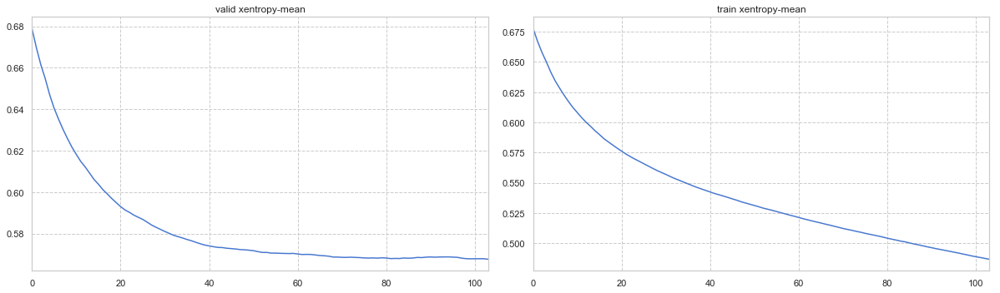


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('binary_logloss', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's auc: 0.772933 + 0.0160191	cv_agg's binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's auc: 0.773914 + 0.0126889	cv_agg's binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's auc: 0.77113 + 0.0116124	cv_agg's binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's auc: 0.769132 + 0.0107175	cv_agg's binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's auc: 0.774163 + 0.0128129	cv_agg's binary_logloss: 0.567659 + 0.00997623
metric_key:binary_logloss


,auc-mean,auc-stdv,binary_logloss-mean,binary_logloss-stdv
99,0.773914,0.012689,0.567869,0.009902
100,0.773939,0.012767,0.567898,0.009931
101,0.773867,0.012762,0.567922,0.009937
102,0.773908,0.012827,0.567912,0.009919
103,0.774163,0.012813,0.567659,0.009976


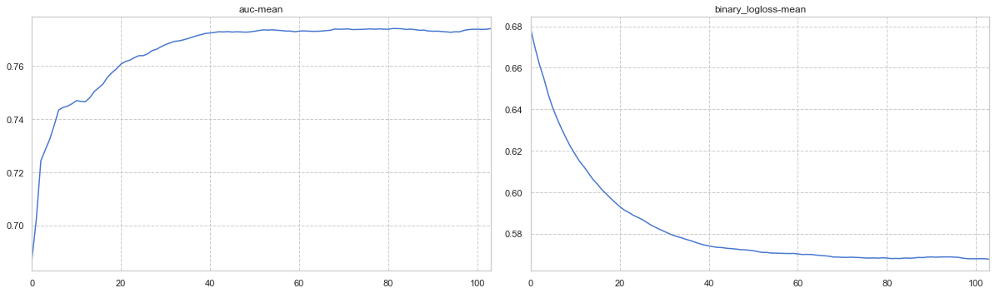


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('auc', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's binary_logloss: 0.572024 + 0.0108773	cv_agg's auc: 0.772933 + 0.0160191
[100]	cv_agg's binary_logloss: 0.567869 + 0.00990152	cv_agg's auc: 0.773914 + 0.0126889
[150]	cv_agg's binary_logloss: 0.569961 + 0.00967098	cv_agg's auc: 0.77113 + 0.0116124
Early stopping, best iteration is:
[82]	cv_agg's binary_logloss: 0.567977 + 0.0102463	cv_agg's auc: 0.774197 + 0.0137751
metric_key:auc


,binary_logloss-mean,binary_logloss-stdv,auc-mean,auc-stdv
77,0.568303,0.010992,0.773952,0.014784
78,0.568192,0.010609,0.774053,0.014320
79,0.568357,0.010661,0.773936,0.014322
80,0.568247,0.010199,0.773933,0.013769
81,0.567977,0.010246,0.774197,0.013775


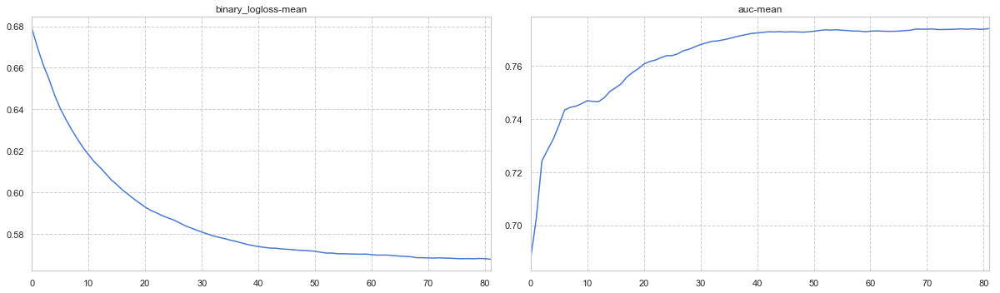


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('binary_logloss', 'auc', 'xentropy')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's xentropy: 0.572024 + 0.0108773	cv_agg's auc: 0.772933 + 0.0160191	cv_agg's binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's xentropy: 0.567869 + 0.00990152	cv_agg's auc: 0.773914 + 0.0126889	cv_agg's binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's xentropy: 0.569961 + 0.00967098	cv_agg's auc: 0.77113 + 0.0116124	cv_agg's binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's xentropy: 0.572429 + 0.00905806	cv_agg's auc: 0.769132 + 0.0107175	cv_agg's binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's xentropy: 0.567659 + 0.00997623	cv_agg's auc: 0.774163 + 0.0128129	cv_agg's binary_logloss: 0.567659 + 0.00997623
metric_key:binary_logloss


,xentropy-mean,xentropy-stdv,auc-mean,auc-stdv,binary_logloss-mean,binary_logloss-stdv
99,0.567869,0.009902,0.773914,0.012689,0.567869,0.009902
100,0.567898,0.009931,0.773939,0.012767,0.567898,0.009931
101,0.567922,0.009937,0.773867,0.012762,0.567922,0.009937
102,0.567912,0.009919,0.773908,0.012827,0.567912,0.009919
103,0.567659,0.009976,0.774163,0.012813,0.567659,0.009976


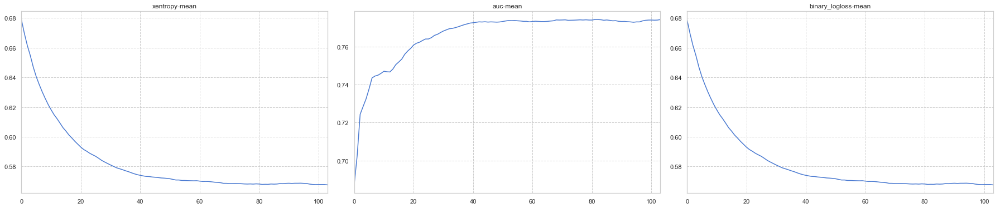


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('binary_logloss', 'xentropy', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's auc: 0.772933 + 0.0160191	cv_agg's xentropy: 0.572024 + 0.0108773	cv_agg's binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's auc: 0.773914 + 0.0126889	cv_agg's xentropy: 0.567869 + 0.00990152	cv_agg's binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's auc: 0.77113 + 0.0116124	cv_agg's xentropy: 0.569961 + 0.00967098	cv_agg's binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's auc: 0.769132 + 0.0107175	cv_agg's xentropy: 0.572429 + 0.00905806	cv_agg's binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's auc: 0.774163 + 0.0128129	cv_agg's xentropy: 0.567659 + 0.00997623	cv_agg's binary_logloss: 0.567659 + 0.00997623
metric_key:binary_logloss


,auc-mean,auc-stdv,xentropy-mean,xentropy-stdv,binary_logloss-mean,binary_logloss-stdv
99,0.773914,0.012689,0.567869,0.009902,0.567869,0.009902
100,0.773939,0.012767,0.567898,0.009931,0.567898,0.009931
101,0.773867,0.012762,0.567922,0.009937,0.567922,0.009937
102,0.773908,0.012827,0.567912,0.009919,0.567912,0.009919
103,0.774163,0.012813,0.567659,0.009976,0.567659,0.009976


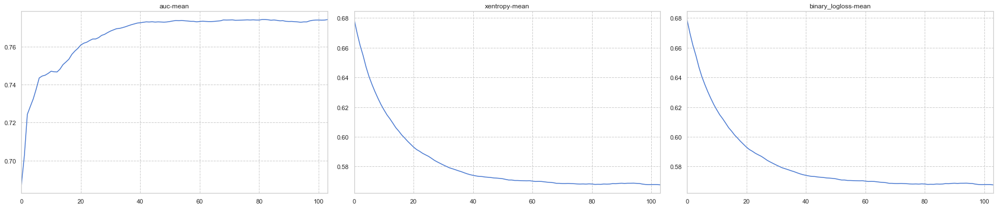


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('auc', 'binary_logloss', 'xentropy')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's xentropy: 0.572024 + 0.0108773	cv_agg's binary_logloss: 0.572024 + 0.0108773	cv_agg's auc: 0.772933 + 0.0160191
[100]	cv_agg's xentropy: 0.567869 + 0.00990152	cv_agg's binary_logloss: 0.567869 + 0.00990152	cv_agg's auc: 0.773914 + 0.0126889
[150]	cv_agg's xentropy: 0.569961 + 0.00967098	cv_agg's binary_logloss: 0.569961 + 0.00967098	cv_agg's auc: 0.77113 + 0.0116124
Early stopping, best iteration is:
[82]	cv_agg's xentropy: 0.567977 + 0.0102463	cv_agg's binary_logloss: 0.567977 + 0.0102463	cv_agg's auc: 0.774197 + 0.0137751
metric_key:auc


,xentropy-mean,xentropy-stdv,binary_logloss-mean,binary_logloss-stdv,auc-mean,auc-stdv
77,0.568303,0.010992,0.568303,0.010992,0.773952,0.014784
78,0.568192,0.010609,0.568192,0.010609,0.774053,0.014320
79,0.568357,0.010661,0.568357,0.010661,0.773936,0.014322
80,0.568247,0.010199,0.568247,0.010199,0.773933,0.013769
81,0.567977,0.010246,0.567977,0.010246,0.774197,0.013775


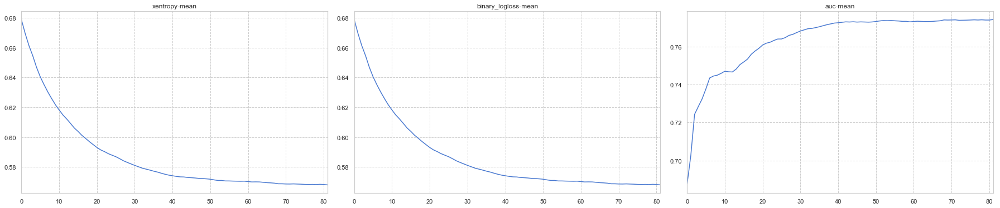


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('auc', 'xentropy', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's binary_logloss: 0.572024 + 0.0108773	cv_agg's xentropy: 0.572024 + 0.0108773	cv_agg's auc: 0.772933 + 0.0160191
[100]	cv_agg's binary_logloss: 0.567869 + 0.00990152	cv_agg's xentropy: 0.567869 + 0.00990152	cv_agg's auc: 0.773914 + 0.0126889
[150]	cv_agg's binary_logloss: 0.569961 + 0.00967098	cv_agg's xentropy: 0.569961 + 0.00967098	cv_agg's auc: 0.77113 + 0.0116124
Early stopping, best iteration is:
[82]	cv_agg's binary_logloss: 0.567977 + 0.0102463	cv_agg's xentropy: 0.567977 + 0.0102463	cv_agg's auc: 0.774197 + 0.0137751
metric_key:auc


,binary_logloss-mean,binary_logloss-stdv,xentropy-mean,xentropy-stdv,auc-mean,auc-stdv
77,0.568303,0.010992,0.568303,0.010992,0.773952,0.014784
78,0.568192,0.010609,0.568192,0.010609,0.774053,0.014320
79,0.568357,0.010661,0.568357,0.010661,0.773936,0.014322
80,0.568247,0.010199,0.568247,0.010199,0.773933,0.013769
81,0.567977,0.010246,0.567977,0.010246,0.774197,0.013775


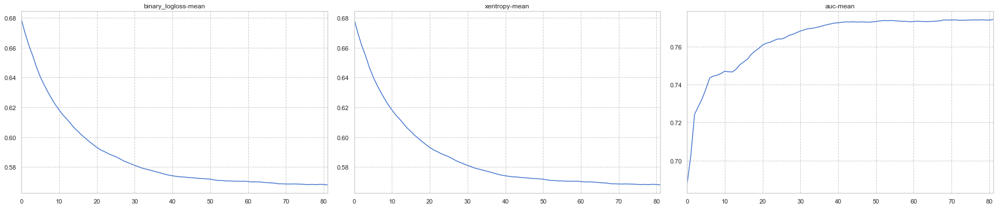


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('xentropy', 'binary_logloss', 'auc')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's auc: 0.772933 + 0.0160191	cv_agg's binary_logloss: 0.572024 + 0.0108773	cv_agg's xentropy: 0.572024 + 0.0108773
[100]	cv_agg's auc: 0.773914 + 0.0126889	cv_agg's binary_logloss: 0.567869 + 0.00990152	cv_agg's xentropy: 0.567869 + 0.00990152
[150]	cv_agg's auc: 0.77113 + 0.0116124	cv_agg's binary_logloss: 0.569961 + 0.00967098	cv_agg's xentropy: 0.569961 + 0.00967098
[200]	cv_agg's auc: 0.769132 + 0.0107175	cv_agg's binary_logloss: 0.572429 + 0.00905806	cv_agg's xentropy: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's auc: 0.774163 + 0.0128129	cv_agg's binary_logloss: 0.567659 + 0.00997623	cv_agg's xentropy: 0.567659 + 0.00997623
metric_key:xentropy


,auc-mean,auc-stdv,binary_logloss-mean,binary_logloss-stdv,xentropy-mean,xentropy-stdv
99,0.773914,0.012689,0.567869,0.009902,0.567869,0.009902
100,0.773939,0.012767,0.567898,0.009931,0.567898,0.009931
101,0.773867,0.012762,0.567922,0.009937,0.567922,0.009937
102,0.773908,0.012827,0.567912,0.009919,0.567912,0.009919
103,0.774163,0.012813,0.567659,0.009976,0.567659,0.009976


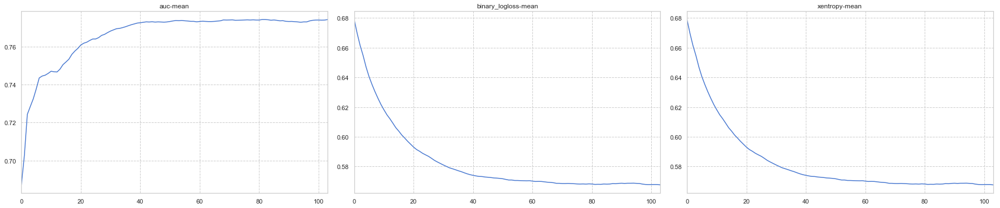


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('xentropy', 'auc', 'binary_logloss')}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's binary_logloss: 0.572024 + 0.0108773	cv_agg's auc: 0.772933 + 0.0160191	cv_agg's xentropy: 0.572024 + 0.0108773
[100]	cv_agg's binary_logloss: 0.567869 + 0.00990152	cv_agg's auc: 0.773914 + 0.0126889	cv_agg's xentropy: 0.567869 + 0.00990152
[150]	cv_agg's binary_logloss: 0.569961 + 0.00967098	cv_agg's auc: 0.77113 + 0.0116124	cv_agg's xentropy: 0.569961 + 0.00967098
[200]	cv_agg's binary_logloss: 0.572429 + 0.00905806	cv_agg's auc: 0.769132 + 0.0107175	cv_agg's xentropy: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's binary_logloss: 0.567659 + 0.00997623	cv_agg's auc: 0.774163 + 0.0128129	cv_agg's xentropy: 0.567659 + 0.00997623
metric_key:xentropy


,binary_logloss-mean,binary_logloss-stdv,auc-mean,auc-stdv,xentropy-mean,xentropy-stdv
99,0.567869,0.009902,0.773914,0.012689,0.567869,0.009902
100,0.567898,0.009931,0.773939,0.012767,0.567898,0.009931
101,0.567922,0.009937,0.773867,0.012762,0.567922,0.009937
102,0.567912,0.009919,0.773908,0.012827,0.567912,0.009919
103,0.567659,0.009976,0.774163,0.012813,0.567659,0.009976


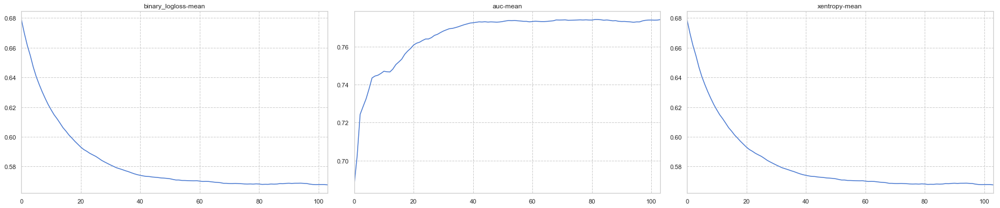


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.

{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-9-59db3dd0020c>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-4-6ad403308e40>", line 53, in classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 228, in _callback
    raise LightGBMError("`metric` should be specified if first_metric_only==True.")
lightgbm.basic.LightGBMError: `metric` should be specified if first_metric_only==True.


[50]	cv_agg's binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's binary_logloss: 0.567659 + 0.00997623
metric_key:binary_logloss


,binary_logloss-mean,binary_logloss-stdv
99,0.567869,0.009902
100,0.567898,0.009931
101,0.567922,0.009937
102,0.567912,0.009919
103,0.567659,0.009976


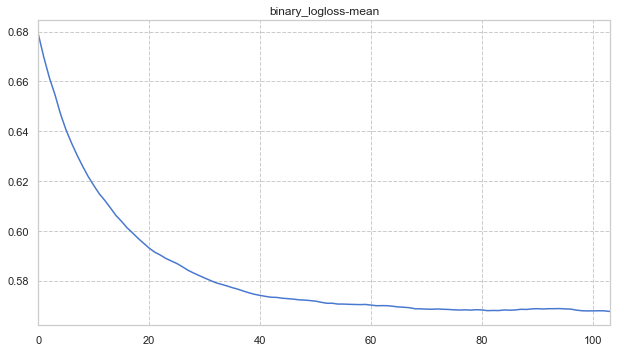


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'None'}

{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'binary_logloss'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-9-59db3dd0020c>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-4-6ad403308e40>", line 53, in classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[50]	cv_agg's binary_logloss: 0.572024 + 0.0108773
[100]	cv_agg's binary_logloss: 0.567869 + 0.00990152
[150]	cv_agg's binary_logloss: 0.569961 + 0.00967098
[200]	cv_agg's binary_logloss: 0.572429 + 0.00905806
Early stopping, best iteration is:
[104]	cv_agg's binary_logloss: 0.567659 + 0.00997623
metric_key:binary_logloss


,binary_logloss-mean,binary_logloss-stdv
99,0.567869,0.009902
100,0.567898,0.009931
101,0.567922,0.009937
102,0.567912,0.009919
103,0.567659,0.009976


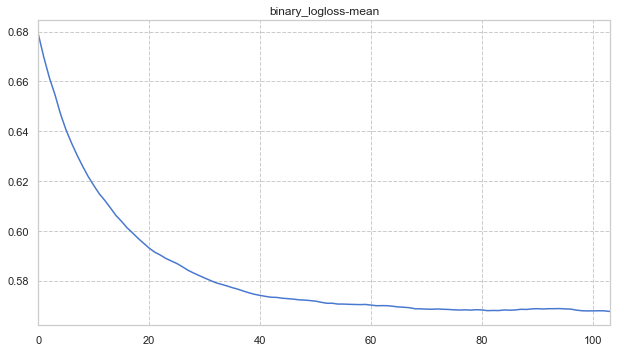


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'auc'}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's auc: 0.772933 + 0.0160191
[100]	cv_agg's auc: 0.773914 + 0.0126889
[150]	cv_agg's auc: 0.77113 + 0.0116124
Early stopping, best iteration is:
[82]	cv_agg's auc: 0.774197 + 0.0137751
metric_key:auc


,auc-mean,auc-stdv
77,0.773952,0.014784
78,0.774053,0.014320
79,0.773936,0.014322
80,0.773933,0.013769
81,0.774197,0.013775


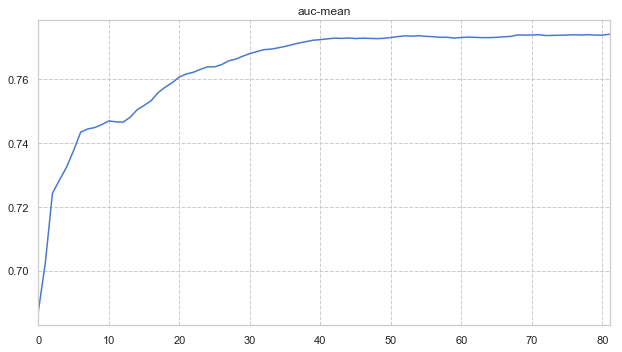


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'xentropy'}
Training until validation scores don't improve for 100 rounds.
[50]	cv_agg's xentropy: 0.572024 + 0.0108773
[100]	cv_agg's xentropy: 0.567869 + 0.00990152


KeyboardInterrupt: 

In [9]:
num_boost_round = 300
for p in pg:
    print("="*100, flush=True)
    print("="*100, flush=True)
    print(p, flush=True)
    try:
        df_ret = classification_train(metric_list=p["metric_list"], 
                             eval_train_metric=p["eval_train_metric"], 
                             first_metric_only=p["first_metric_only"],
                             num_boost_round=num_boost_round)
        draw_metric_graph(df_ret)
        if df_ret.shape[0]==num_boost_round:
            raise Exception("early_stopping was not applied.")
    except Exception as e:
        traceback.print_exc()
        
    print("", flush=True)
    # break

# Multi-label classification

In [10]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [20]:
def load_data_for_multi_label_classification():
    rd.seed(123)
    print('Loading data...')
    # Loading Iris Dataset
    iris = datasets.load_iris()
    X, y = iris.data, iris.target

    # Split dataset for this demonstration.
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    shuffle=True,
                                                    random_state=42)
    return X_train, y_train, X_test, y_test

def multi_label_classification_train(metric_list=None, first_metric_only=True, eval_train_metric=True, num_boost_round=500):
    # one hot representation of y_train
    max_class_num = y_train.max()+1
    y_train_ohe = np.identity(max_class_num)[y_train]

    # Create LightGBM dataset for train.
    lgb_train = lgb.Dataset(X_train, y_train, free_raw_data=False)

    # LightGBM parameter
    params = {
        'boosting_type': 'gbdt',
        'objective': 'multiclass',
        'metric' :metric_list,
        # 'metric' : ["multi_logloss", "multi_error", ],
        'num_class': 3,
        'verbosity' : -1,
    }
    callbacks = [
        lgb.early_stopping(stopping_rounds=100, first_metric_only=first_metric_only, verbose=True),
        #lgb.record_evaluation(res_dict)
    ]

    # Training settings
    FOLD_NUM = 5
    fold_seed = 71
    folds = StratifiedKFold(n_splits=FOLD_NUM, shuffle=True, random_state=fold_seed)
    eval_train_metric=True
    # # Fitting
    ret = lgb.cv(params=params,
                   train_set=lgb_train,
                   folds=folds,
                   num_boost_round=num_boost_round,
                   verbose_eval = 30,
                   callbacks=callbacks, 
                   eval_train_metric=eval_train_metric,
                   # return_boosters=True
                   )
    df_ret = pd.DataFrame(ret)
    display(df_ret.tail())
    return df_ret
    

In [21]:
X_train, y_train, X_test, y_test = load_data_for_multi_label_classification()

Loading data...


In [22]:
from itertools import permutations
two_metrics = list(permutations(["multi_logloss", "multi_error", ], 2))

param_grid = {
#        "metric_list" : [two_metrics[0]], 
    "metric_list" : two_metrics + [
                      None, "", "None", "multi_logloss", "multi_error",  # just one metric
                    ] , 
    #"metric_list" : [""], 
    "first_metric_only": [True, False],
    "eval_train_metric": [True, False],
}
pg = ParameterGrid(param_grid)

{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('multi_logloss', 'multi_error')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_error: 0.0716168 + 0.0593762	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_error: 0.0807077 + 0.0581416	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_error: 0.072012 + 0.0454085	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_error: 0.0807077 + 0.0333468	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early s

,train multi_error-mean,train multi_error-stdv,train multi_logloss-mean,train multi_logloss-stdv,valid multi_error-mean,valid multi_error-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.029015,0.011382,0.115982,0.016045,0.071617,0.059376,0.295804,0.135394
34,0.031262,0.013070,0.112324,0.015875,0.071617,0.059376,0.296125,0.138316
35,0.029015,0.011382,0.108726,0.015537,0.071617,0.059376,0.296504,0.141331
36,0.026793,0.008985,0.104969,0.015449,0.071617,0.059376,0.297446,0.144257
37,0.024570,0.008450,0.101291,0.015524,0.080708,0.058142,0.294398,0.144149


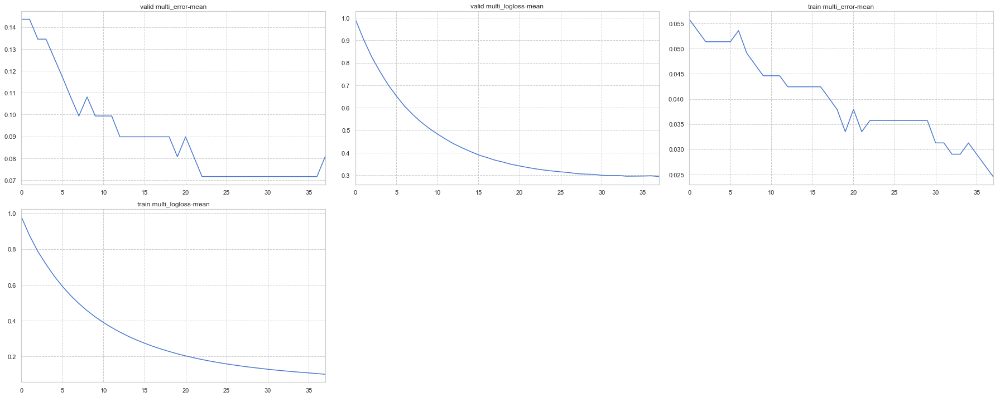


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('multi_error', 'multi_logloss')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_logloss: 0.303975 + 0.129743	cv_agg's valid multi_error: 0.0716168 + 0.0593762
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's valid multi_logloss: 0.30044 + 0.185254	cv_agg's valid multi_error: 0.0807077 + 0.0581416
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_logloss: 0.327377 + 0.237144	cv_agg's valid multi_error: 0.072012 + 0.0454085
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_logloss: 0.370295 + 0.277056	cv_agg's valid multi_error: 0.0807077 + 0.0333468
Early 

,train multi_logloss-mean,train multi_logloss-stdv,train multi_error-mean,train multi_error-stdv,valid multi_logloss-mean,valid multi_logloss-stdv,valid multi_error-mean,valid multi_error-stdv
18,0.228277,0.016910,0.037929,0.016726,0.358475,0.100058,0.089799,0.062422
19,0.215409,0.016715,0.033485,0.014216,0.348635,0.104418,0.080708,0.058142
20,0.203825,0.016549,0.037929,0.016726,0.341552,0.107705,0.089799,0.062422
21,0.193139,0.016468,0.033485,0.014216,0.334496,0.110455,0.080708,0.058142
22,0.183447,0.016354,0.035707,0.014872,0.328291,0.114151,0.071617,0.059376


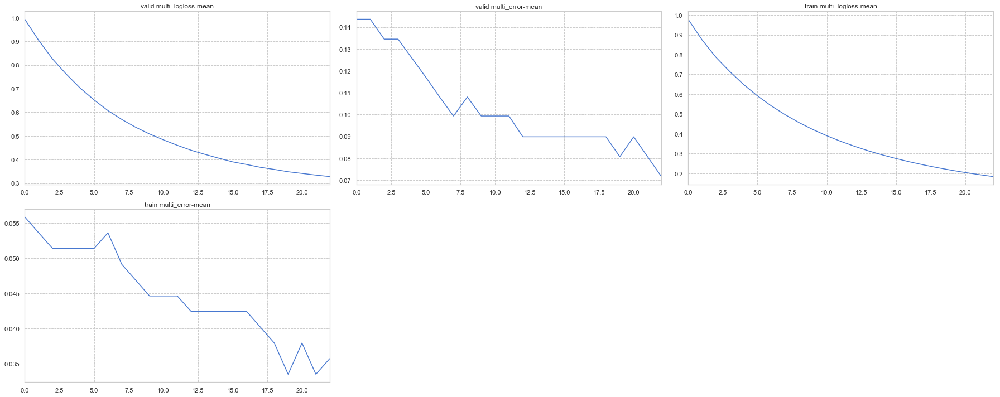


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.

{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-23-df46778f179f>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-20-9e7129158d24>", line 48, in multi_label_classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 228, in _callback
    raise LightGBMError("`metric` should be specified if first_metric_only==True.")
lightgbm.basic.LightGBMError: `metric` should be specified if first_metric_only==True.


[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149
metric_key:valid multi_logloss


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


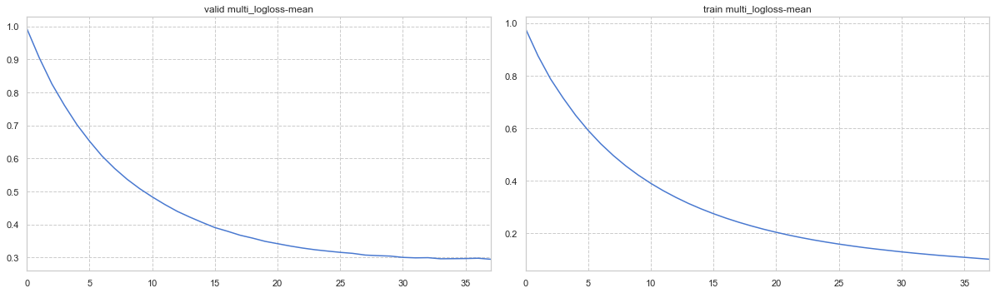


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'None'}

{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'multi_logloss'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-23-df46778f179f>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-20-9e7129158d24>", line 48, in multi_label_classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149
metric_key:valid multi_logloss


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


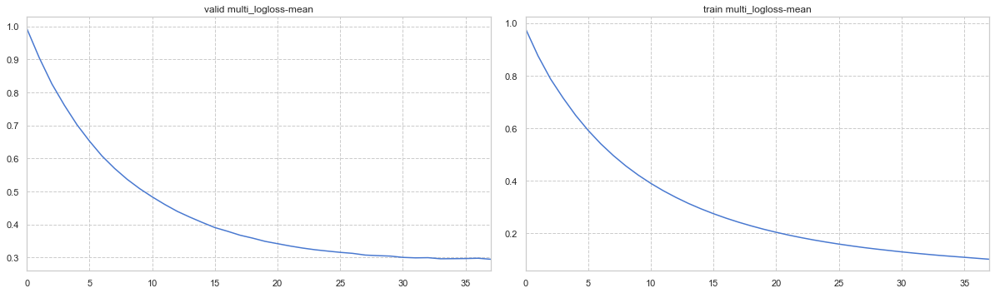


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'multi_error'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_error: 0.0716168 + 0.0593762
[60]	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's valid multi_error: 0.0807077 + 0.0581416
[90]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_error: 0.072012 + 0.0454085
[120]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_error: 0.0807077 + 0.0333468
Early stopping, best iteration is:
[23]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_error: 0.0716168 + 0.0593762
metric_key:valid multi_error


,train multi_error-mean,train multi_error-stdv,valid multi_error-mean,valid multi_error-stdv
18,0.037929,0.016726,0.089799,0.062422
19,0.033485,0.014216,0.080708,0.058142
20,0.037929,0.016726,0.089799,0.062422
21,0.033485,0.014216,0.080708,0.058142
22,0.035707,0.014872,0.071617,0.059376


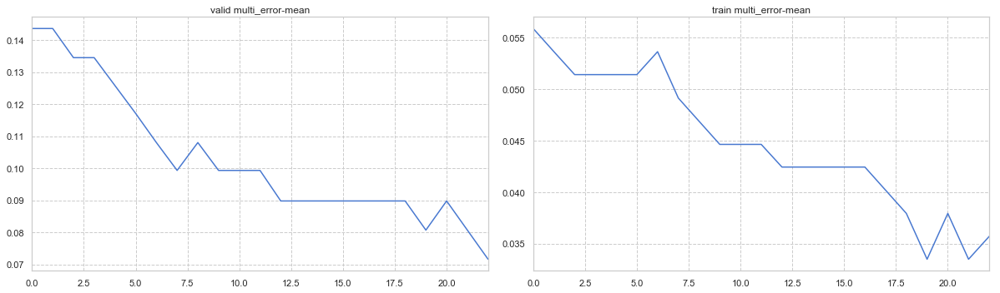


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('multi_logloss', 'multi_error')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_error: 0.0716168 + 0.0593762	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_error: 0.0807077 + 0.0581416	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_error: 0.072012 + 0.0454085	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_error: 0.0807077 + 0.0333468	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early

,train multi_error-mean,train multi_error-stdv,train multi_logloss-mean,train multi_logloss-stdv,valid multi_error-mean,valid multi_error-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
18,0.037929,0.016726,0.228277,0.016910,0.089799,0.062422,0.358475,0.100058
19,0.033485,0.014216,0.215409,0.016715,0.080708,0.058142,0.348635,0.104418
20,0.037929,0.016726,0.203825,0.016549,0.089799,0.062422,0.341552,0.107705
21,0.033485,0.014216,0.193139,0.016468,0.080708,0.058142,0.334496,0.110455
22,0.035707,0.014872,0.183447,0.016354,0.071617,0.059376,0.328291,0.114151


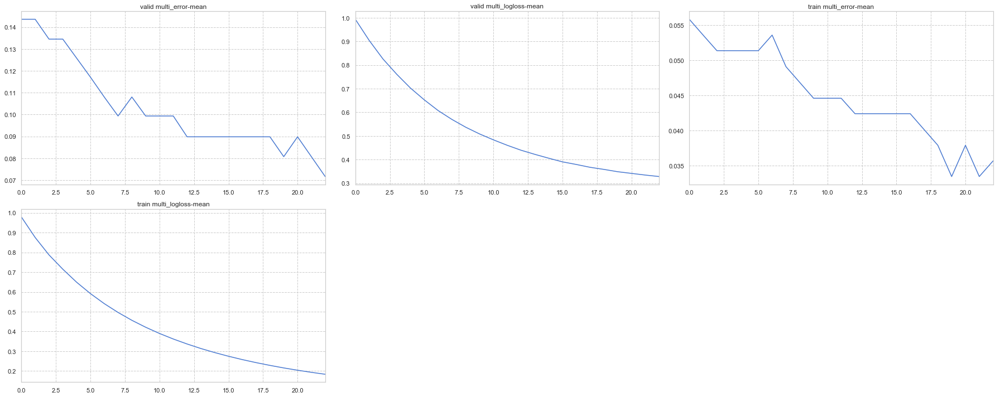


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('multi_error', 'multi_logloss')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_logloss: 0.303975 + 0.129743	cv_agg's valid multi_error: 0.0716168 + 0.0593762
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's valid multi_logloss: 0.30044 + 0.185254	cv_agg's valid multi_error: 0.0807077 + 0.0581416
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_logloss: 0.327377 + 0.237144	cv_agg's valid multi_error: 0.072012 + 0.0454085
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_logloss: 0.370295 + 0.277056	cv_agg's valid multi_error: 0.0807077 + 0.0333468
Early

,train multi_logloss-mean,train multi_logloss-stdv,train multi_error-mean,train multi_error-stdv,valid multi_logloss-mean,valid multi_logloss-stdv,valid multi_error-mean,valid multi_error-stdv
18,0.228277,0.016910,0.037929,0.016726,0.358475,0.100058,0.089799,0.062422
19,0.215409,0.016715,0.033485,0.014216,0.348635,0.104418,0.080708,0.058142
20,0.203825,0.016549,0.037929,0.016726,0.341552,0.107705,0.089799,0.062422
21,0.193139,0.016468,0.033485,0.014216,0.334496,0.110455,0.080708,0.058142
22,0.183447,0.016354,0.035707,0.014872,0.328291,0.114151,0.071617,0.059376


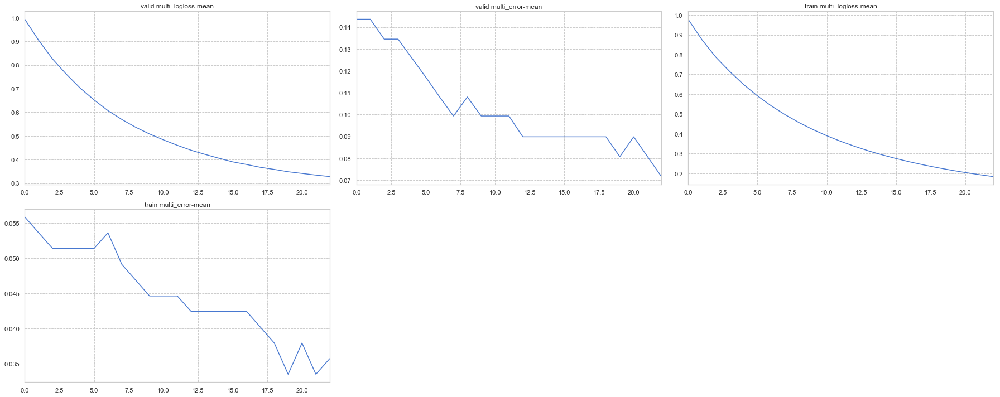


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


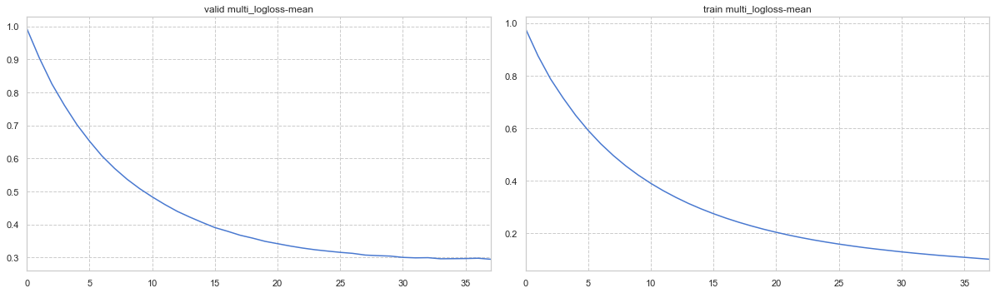


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


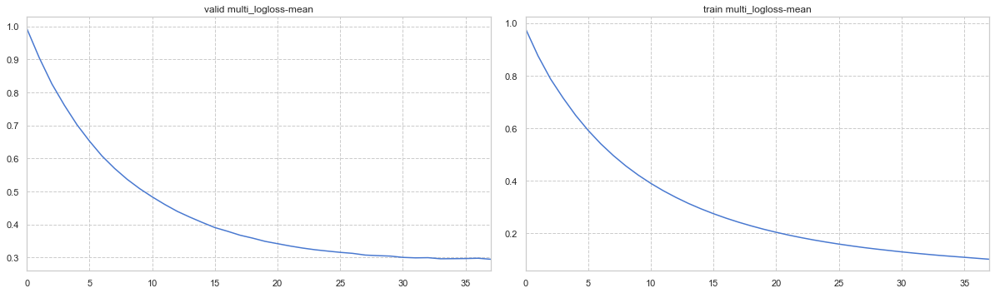


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'None'}

{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'multi_logloss'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-23-df46778f179f>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-20-9e7129158d24>", line 48, in multi_label_classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


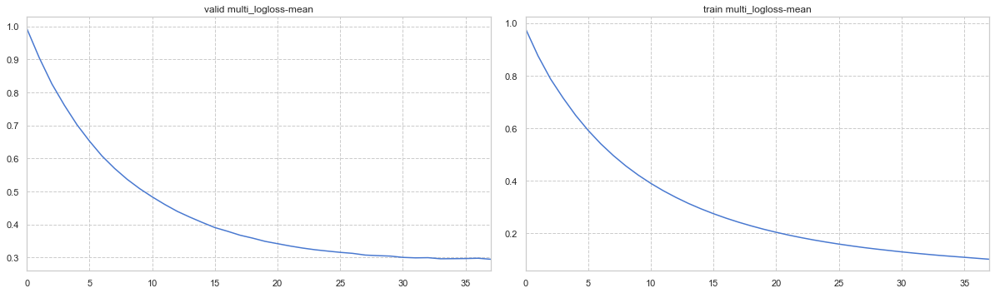


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'multi_error'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_error: 0.0716168 + 0.0593762
[60]	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's valid multi_error: 0.0807077 + 0.0581416
[90]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_error: 0.072012 + 0.0454085
[120]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_error: 0.0807077 + 0.0333468
Early stopping, best iteration is:
[23]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_error: 0.0716168 + 0.0593762


,train multi_error-mean,train multi_error-stdv,valid multi_error-mean,valid multi_error-stdv
18,0.037929,0.016726,0.089799,0.062422
19,0.033485,0.014216,0.080708,0.058142
20,0.037929,0.016726,0.089799,0.062422
21,0.033485,0.014216,0.080708,0.058142
22,0.035707,0.014872,0.071617,0.059376


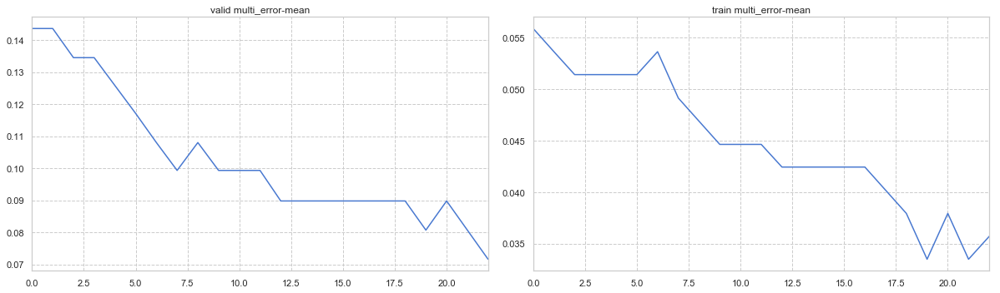


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('multi_logloss', 'multi_error')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_error: 0.0716168 + 0.0593762	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_error: 0.0807077 + 0.0581416	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_error: 0.072012 + 0.0454085	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_error: 0.0807077 + 0.0333468	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early

,train multi_error-mean,train multi_error-stdv,train multi_logloss-mean,train multi_logloss-stdv,valid multi_error-mean,valid multi_error-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.029015,0.011382,0.115982,0.016045,0.071617,0.059376,0.295804,0.135394
34,0.031262,0.013070,0.112324,0.015875,0.071617,0.059376,0.296125,0.138316
35,0.029015,0.011382,0.108726,0.015537,0.071617,0.059376,0.296504,0.141331
36,0.026793,0.008985,0.104969,0.015449,0.071617,0.059376,0.297446,0.144257
37,0.024570,0.008450,0.101291,0.015524,0.080708,0.058142,0.294398,0.144149


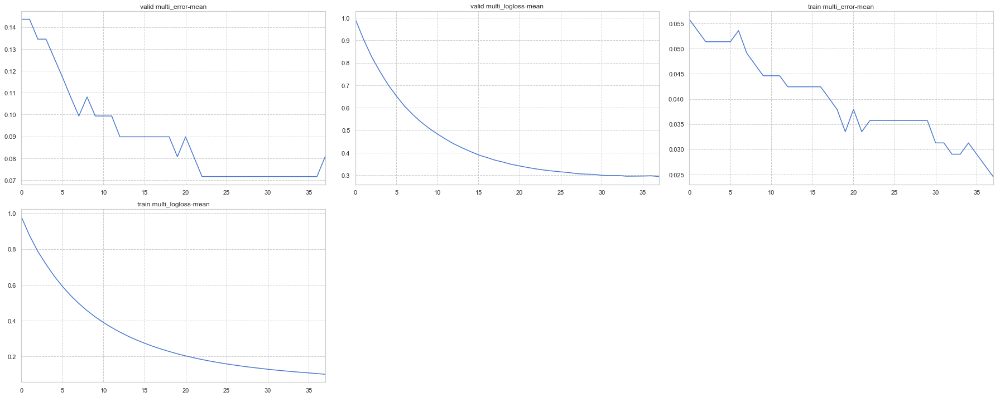


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('multi_error', 'multi_logloss')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_logloss: 0.303975 + 0.129743	cv_agg's valid multi_error: 0.0716168 + 0.0593762
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's valid multi_logloss: 0.30044 + 0.185254	cv_agg's valid multi_error: 0.0807077 + 0.0581416
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_logloss: 0.327377 + 0.237144	cv_agg's valid multi_error: 0.072012 + 0.0454085
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_logloss: 0.370295 + 0.277056	cv_agg's valid multi_error: 0.0807077 + 0.0333468
Early

,train multi_logloss-mean,train multi_logloss-stdv,train multi_error-mean,train multi_error-stdv,valid multi_logloss-mean,valid multi_logloss-stdv,valid multi_error-mean,valid multi_error-stdv
18,0.228277,0.016910,0.037929,0.016726,0.358475,0.100058,0.089799,0.062422
19,0.215409,0.016715,0.033485,0.014216,0.348635,0.104418,0.080708,0.058142
20,0.203825,0.016549,0.037929,0.016726,0.341552,0.107705,0.089799,0.062422
21,0.193139,0.016468,0.033485,0.014216,0.334496,0.110455,0.080708,0.058142
22,0.183447,0.016354,0.035707,0.014872,0.328291,0.114151,0.071617,0.059376


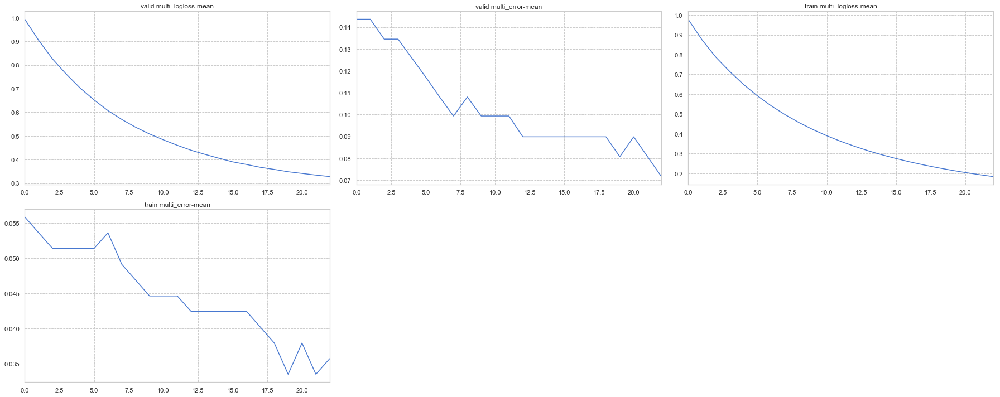


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.

{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-23-df46778f179f>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-20-9e7129158d24>", line 48, in multi_label_classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 228, in _callback
    raise LightGBMError("`metric` should be specified if first_metric_only==True.")
lightgbm.basic.LightGBMError: `metric` should be specified if first_metric_only==True.


[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149
metric_key:valid multi_logloss


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


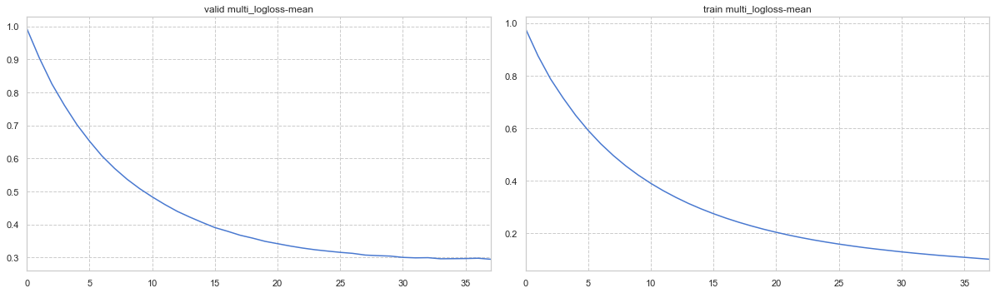


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'None'}

{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'multi_logloss'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-23-df46778f179f>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-20-9e7129158d24>", line 48, in multi_label_classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149
metric_key:valid multi_logloss


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


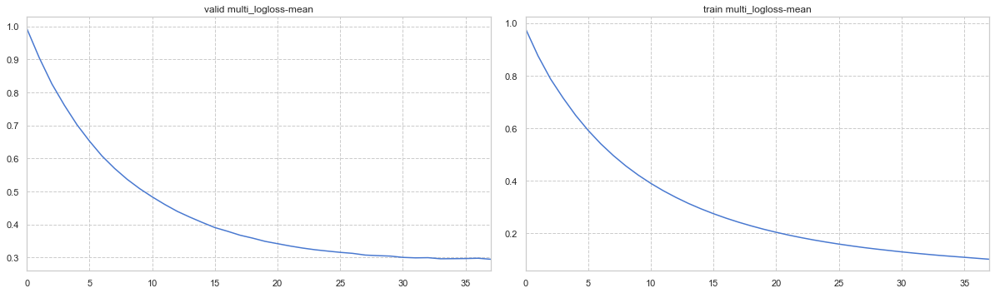


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'multi_error'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_error: 0.0716168 + 0.0593762
[60]	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's valid multi_error: 0.0807077 + 0.0581416
[90]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_error: 0.072012 + 0.0454085
[120]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_error: 0.0807077 + 0.0333468
Early stopping, best iteration is:
[23]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_error: 0.0716168 + 0.0593762
metric_key:valid multi_error


,train multi_error-mean,train multi_error-stdv,valid multi_error-mean,valid multi_error-stdv
18,0.037929,0.016726,0.089799,0.062422
19,0.033485,0.014216,0.080708,0.058142
20,0.037929,0.016726,0.089799,0.062422
21,0.033485,0.014216,0.080708,0.058142
22,0.035707,0.014872,0.071617,0.059376


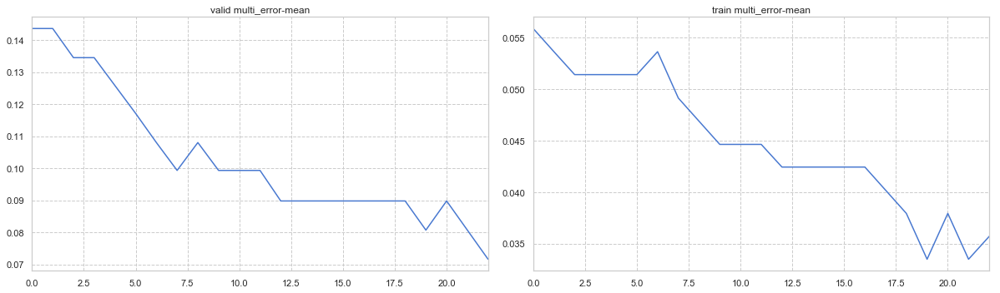


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('multi_logloss', 'multi_error')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_error: 0.0716168 + 0.0593762	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_error: 0.0807077 + 0.0581416	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_error: 0.072012 + 0.0454085	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_error: 0.0807077 + 0.0333468	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Earl

,train multi_error-mean,train multi_error-stdv,train multi_logloss-mean,train multi_logloss-stdv,valid multi_error-mean,valid multi_error-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
18,0.037929,0.016726,0.228277,0.016910,0.089799,0.062422,0.358475,0.100058
19,0.033485,0.014216,0.215409,0.016715,0.080708,0.058142,0.348635,0.104418
20,0.037929,0.016726,0.203825,0.016549,0.089799,0.062422,0.341552,0.107705
21,0.033485,0.014216,0.193139,0.016468,0.080708,0.058142,0.334496,0.110455
22,0.035707,0.014872,0.183447,0.016354,0.071617,0.059376,0.328291,0.114151


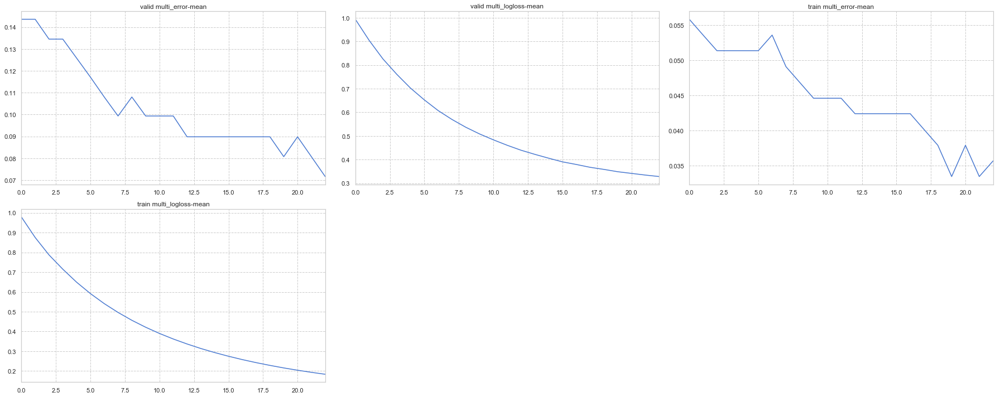


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('multi_error', 'multi_logloss')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_logloss: 0.303975 + 0.129743	cv_agg's valid multi_error: 0.0716168 + 0.0593762
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's valid multi_logloss: 0.30044 + 0.185254	cv_agg's valid multi_error: 0.0807077 + 0.0581416
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_logloss: 0.327377 + 0.237144	cv_agg's valid multi_error: 0.072012 + 0.0454085
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_logloss: 0.370295 + 0.277056	cv_agg's valid multi_error: 0.0807077 + 0.0333468
Earl

,train multi_logloss-mean,train multi_logloss-stdv,train multi_error-mean,train multi_error-stdv,valid multi_logloss-mean,valid multi_logloss-stdv,valid multi_error-mean,valid multi_error-stdv
18,0.228277,0.016910,0.037929,0.016726,0.358475,0.100058,0.089799,0.062422
19,0.215409,0.016715,0.033485,0.014216,0.348635,0.104418,0.080708,0.058142
20,0.203825,0.016549,0.037929,0.016726,0.341552,0.107705,0.089799,0.062422
21,0.193139,0.016468,0.033485,0.014216,0.334496,0.110455,0.080708,0.058142
22,0.183447,0.016354,0.035707,0.014872,0.328291,0.114151,0.071617,0.059376


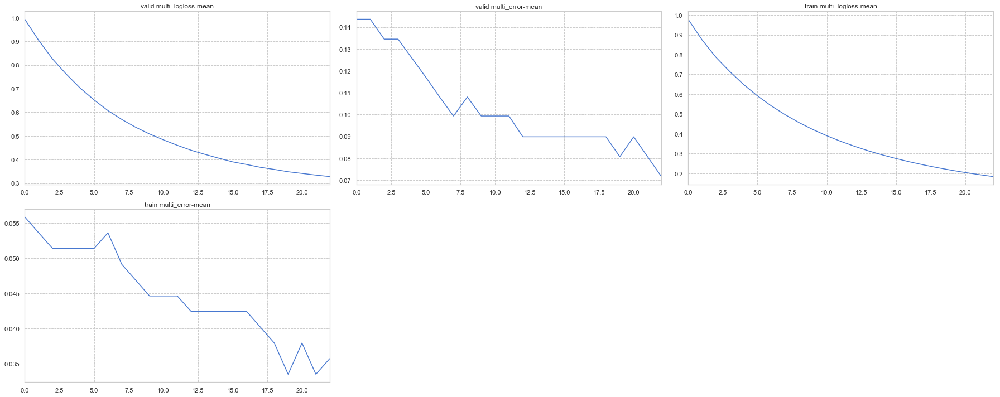


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


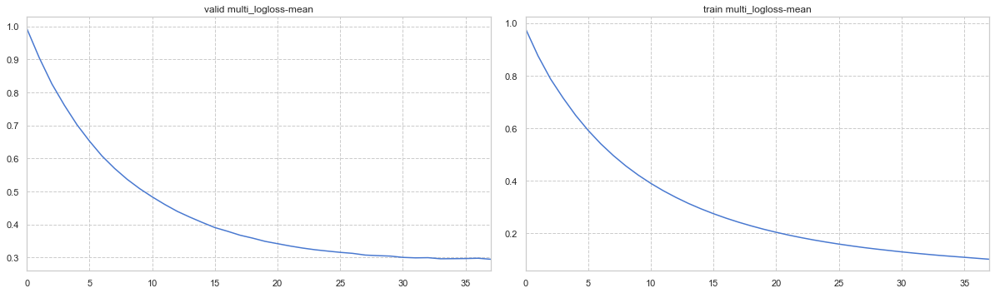


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


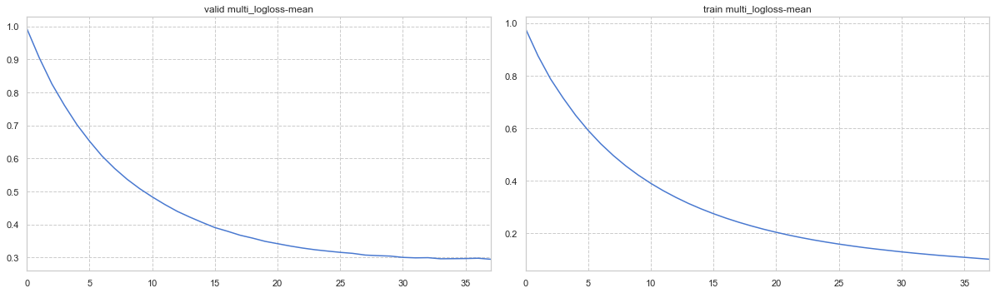


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': 'None'}

{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': 'multi_logloss'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-23-df46778f179f>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-20-9e7129158d24>", line 48, in multi_label_classification_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[30]	cv_agg's train multi_logloss: 0.13462 + 0.0160243	cv_agg's valid multi_logloss: 0.303975 + 0.129743
[60]	cv_agg's train multi_logloss: 0.0569382 + 0.0144529	cv_agg's valid multi_logloss: 0.30044 + 0.185254
[90]	cv_agg's train multi_logloss: 0.0360136 + 0.013976	cv_agg's valid multi_logloss: 0.327377 + 0.237144
[120]	cv_agg's train multi_logloss: 0.0263465 + 0.013389	cv_agg's valid multi_logloss: 0.370295 + 0.277056
Early stopping, best iteration is:
[38]	cv_agg's train multi_logloss: 0.101291 + 0.0155241	cv_agg's valid multi_logloss: 0.294398 + 0.144149


,train multi_logloss-mean,train multi_logloss-stdv,valid multi_logloss-mean,valid multi_logloss-stdv
33,0.115982,0.016045,0.295804,0.135394
34,0.112324,0.015875,0.296125,0.138316
35,0.108726,0.015537,0.296504,0.141331
36,0.104969,0.015449,0.297446,0.144257
37,0.101291,0.015524,0.294398,0.144149


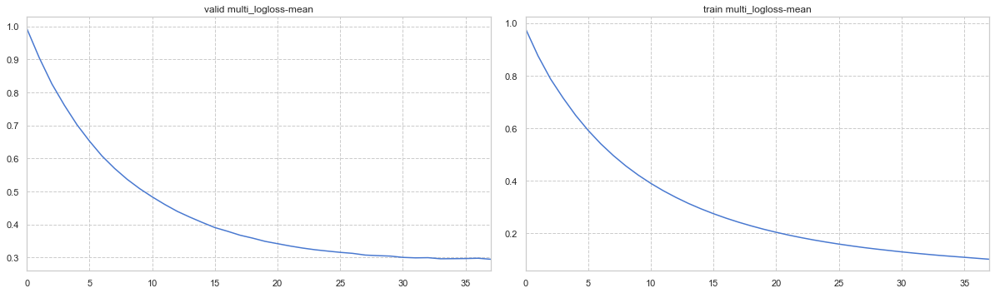


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': 'multi_error'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_error: 0.0716168 + 0.0593762
[60]	cv_agg's train multi_error: 0.0156809 + 0.0114783	cv_agg's valid multi_error: 0.0807077 + 0.0581416
[90]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_error: 0.072012 + 0.0454085
[120]	cv_agg's train multi_error: 0.00893938 + 0.00839559	cv_agg's valid multi_error: 0.0807077 + 0.0333468
Early stopping, best iteration is:
[23]	cv_agg's train multi_error: 0.035707 + 0.0148715	cv_agg's valid multi_error: 0.0716168 + 0.0593762


,train multi_error-mean,train multi_error-stdv,valid multi_error-mean,valid multi_error-stdv
18,0.037929,0.016726,0.089799,0.062422
19,0.033485,0.014216,0.080708,0.058142
20,0.037929,0.016726,0.089799,0.062422
21,0.033485,0.014216,0.080708,0.058142
22,0.035707,0.014872,0.071617,0.059376


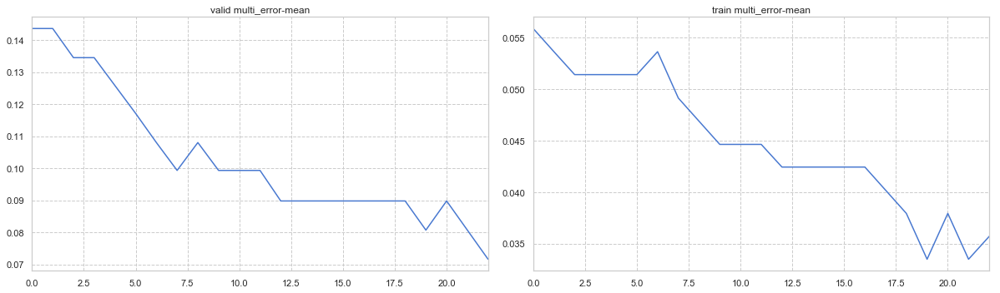

In [23]:
num_boost_round = 300
for p in pg:
    print("="*100, flush=True)
    print("="*100, flush=True)
    print(p, flush=True)
    try:
        df_ret = multi_label_classification_train(metric_list=p["metric_list"], 
                             eval_train_metric=p["eval_train_metric"], 
                             first_metric_only=p["first_metric_only"],
                             num_boost_round=num_boost_round)
        draw_metric_graph(df_ret)
        if df_ret.shape[0]==num_boost_round:
            raise Exception("early_stopping was not applied.")
    except Exception as e:
        traceback.print_exc()
        
    print("", flush=True)
    # break

# Regression

In [45]:
from sklearn.metrics import mean_absolute_error

In [33]:
def load_data_for_regression():
    rd.seed(123)
    print('Loading data...')
    df_train = pd.read_csv('../dataset/regression.train', header=None, sep='\t')
    df_test = pd.read_csv('../dataset/regression.test', header=None, sep='\t')

    y_train = df_train[0]
    y_test = df_test[0]
    X_train = df_train.drop(0, axis=1)
    X_test = df_test.drop(0, axis=1)
    return X_train, y_train, X_test, y_test


def regression_train(metric_list=None, first_metric_only=True, eval_train_metric=True, num_boost_round=500):
    lgb_train = lgb.Dataset(X_train, y_train)

    params = {
        'boosting_type': 'gbdt',
        'objective': 'regression',
        'learning_rate': 0.5,
        'num_leaves': 5,
        #'metric': ['l1', 'l2'],
        'metric' :metric_list,
        'verbose': -1
    }

    callbacks = [
        lgb.early_stopping(stopping_rounds=100, first_metric_only=first_metric_only, verbose=True),
        #lgb.record_evaluation(res_dict)
    ]

    # Training settings
    FOLD_NUM = 5
    fold_seed = 71
    folds = StratifiedKFold(n_splits=FOLD_NUM, shuffle=True, random_state=fold_seed)
    eval_train_metric=True
    # # Fitting
    ret = lgb.cv(params=params,
                   train_set=lgb_train,
                   folds=folds,
                   num_boost_round=num_boost_round,
                   verbose_eval = 30,
                   callbacks=callbacks, 
                   eval_train_metric=eval_train_metric,
                   #return_boosters=True
                   )
    #print(f"best_iteration : {model.best_iteration}")

    df_ret = pd.DataFrame(ret)
    df_ret.tail()
    return df_ret


In [34]:
X_train, y_train, X_test, y_test = load_data_for_regression()

Loading data...


In [35]:
from itertools import permutations
two_metrics = list(permutations(['l1','l2', ], 2))
three_metrics = list(permutations(['l1','l2',  'rmse'], 3))

param_grid = {
#        "metric_list" : [two_metrics[0]], 
    "metric_list" : two_metrics + three_metrics + [
                      None, "", "None", 'l1','l2',  'rmse',  # just one metric
                    ] , 
    #"metric_list" : [""], 
    "first_metric_only": [True, False],
    "eval_train_metric": [True, False],
}
pg = ParameterGrid(param_grid)

{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('l1', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train l2: 0.122033 + 0.00108333	cv_agg's train l1: 0.296659 + 0.00196172	cv_agg's valid l2: 0.213233 + 0.00281925	cv_agg's valid l1: 0.395996 + 0.00343599
[150]	cv_agg's train l2: 0.110439 + 0.00116102	cv_agg's train l1: 0.280029 + 0.00192059	cv_agg's valid l2: 0.216656 + 0.00209944	cv_agg's valid l1: 0.39735 + 0.00318484
Early s

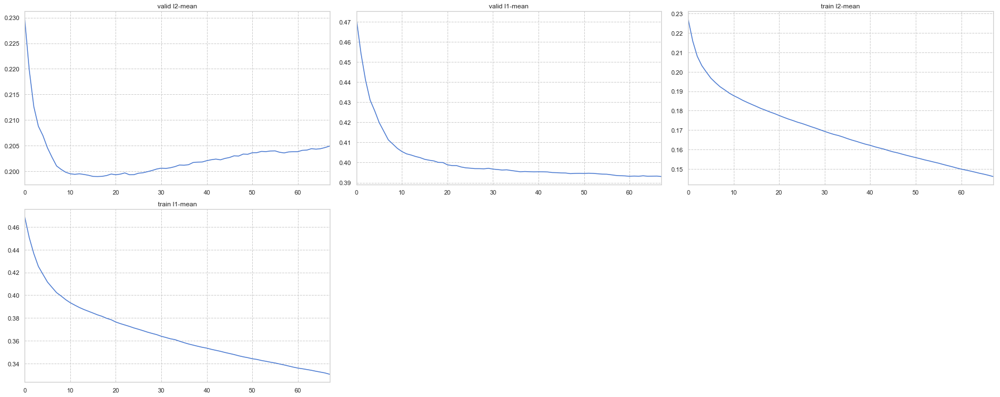


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('l2', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l1: 0.401154 + 0.00478475	cv_agg's valid l2: 0.198944 + 0.00400309
metric_key:valid l2


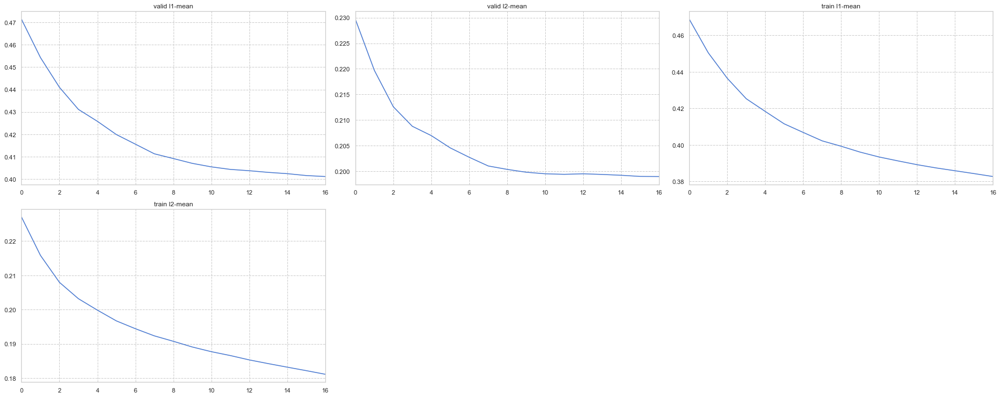


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('l1', 'l2', 'rmse')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train rmse: 0.349329 + 0.00155094	cv_agg's train l2: 0.122033 + 0.

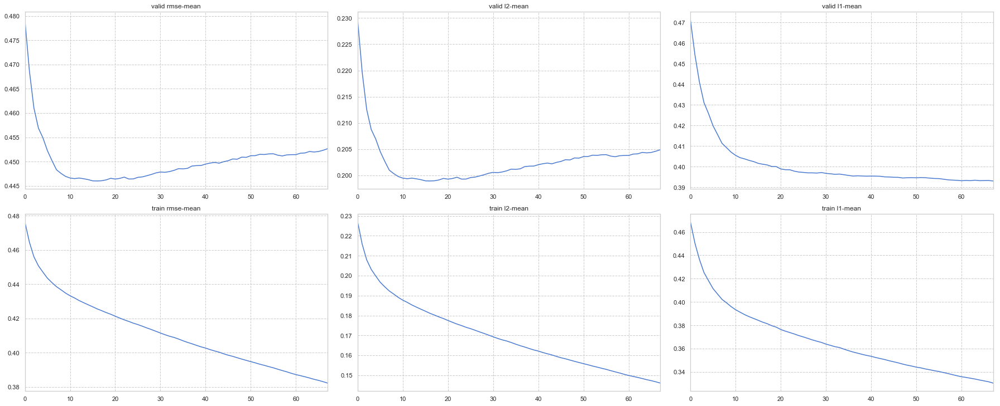


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('l1', 'rmse', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train l2: 0.122033 + 0.00108333	cv_agg's train rmse: 0.349329 + 0.

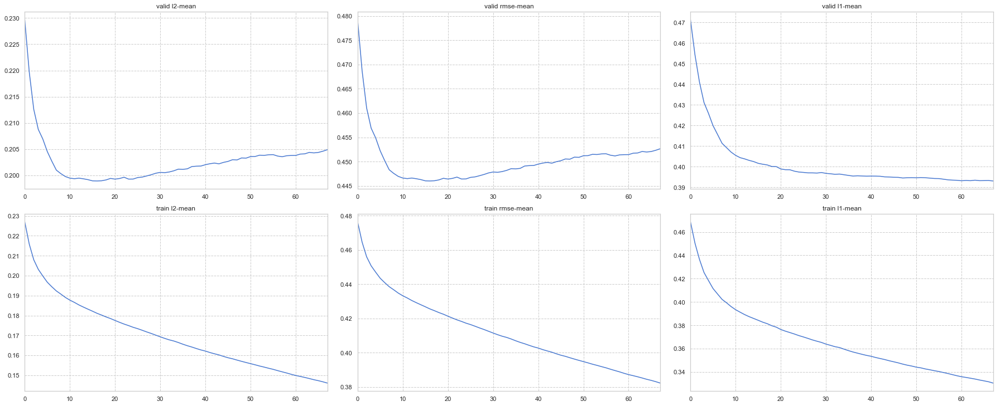


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('l2', 'l1', 'rmse')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.0010277

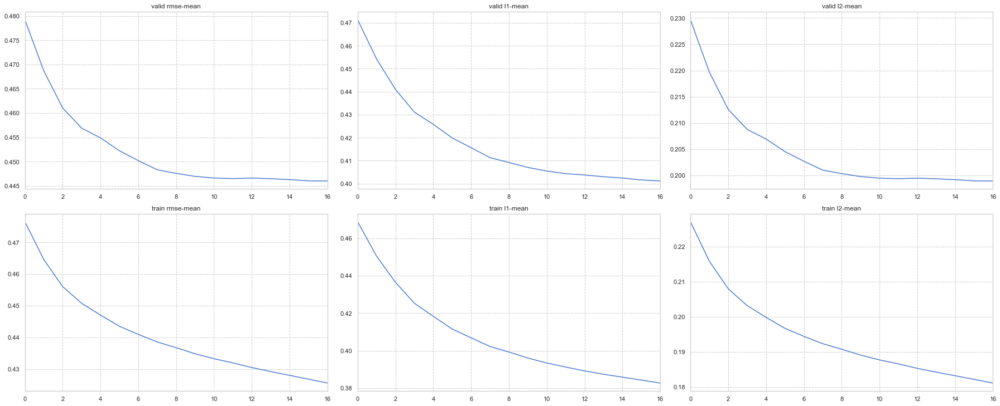


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('l2', 'rmse', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	c

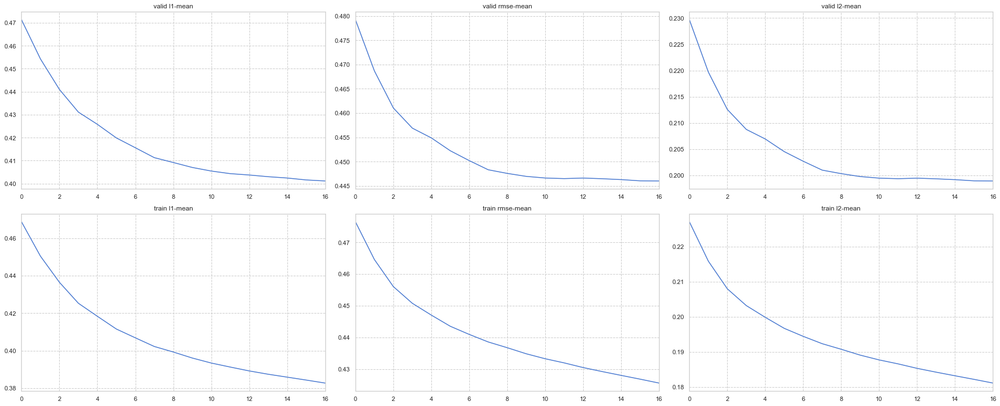


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('rmse', 'l1', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	

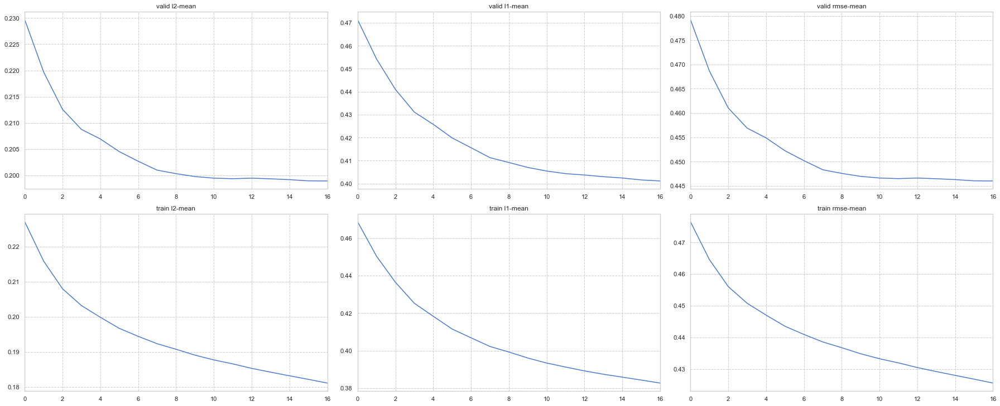


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ('rmse', 'l2', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	c

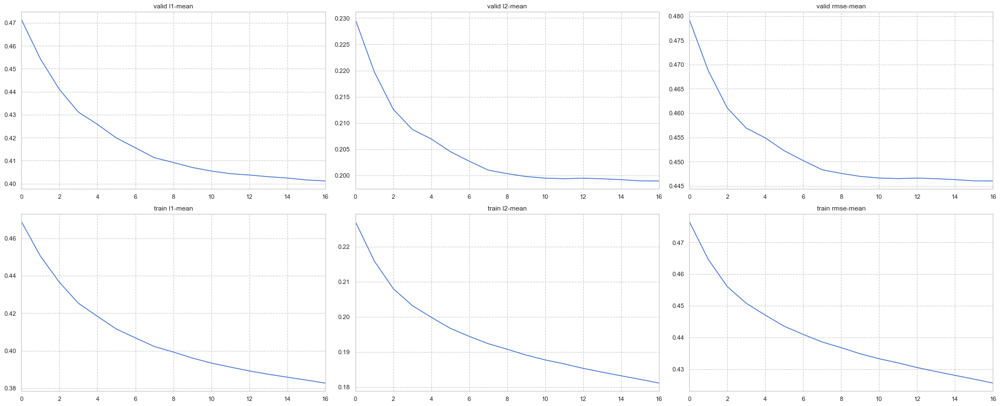


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.

{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-36-d38db90cb235>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-33-589a64a60485>", line 44, in regression_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 228, in _callback
    raise LightGBMError("`metric` should be specified if first_metric_only==True.")
lightgbm.basic.LightGBMError: `metric` should be specified if first_metric_only==True.


[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309
metric_key:valid l2


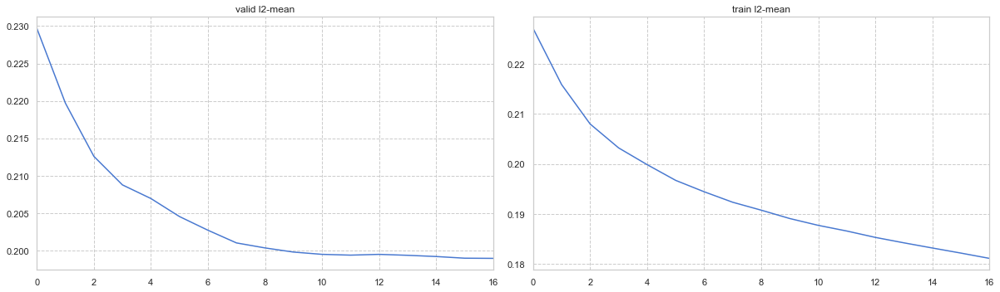


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'None'}

{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'l1'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-36-d38db90cb235>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-33-589a64a60485>", line 44, in regression_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train l1: 0.296659 + 0.00196172	cv_agg's valid l1: 0.395996 + 0.00343599
[150]	cv_agg's train l1: 0.280029 + 0.00192059	cv_agg's valid l1: 0.39735 + 0.00318484
Early stopping, best iteration is:
[68]	cv_agg's train l1: 0.330498 + 0.00213712	cv_agg's valid l1: 0.393031 + 0.00319347
metric_key:valid l1


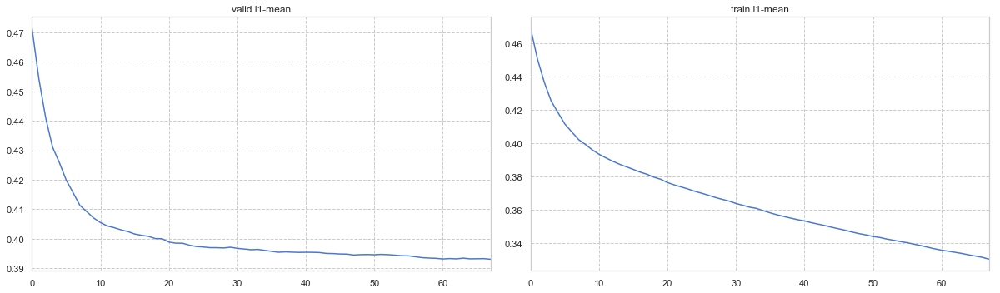


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'l2'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309
metric_key:valid l2


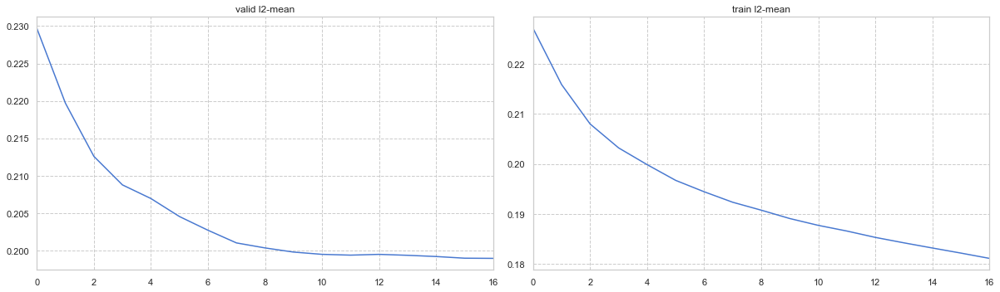


{'eval_train_metric': True, 'first_metric_only': True, 'metric_list': 'rmse'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.00102774	cv_agg's valid rmse: 0.446009 + 0.00448162
metric_key:valid rmse


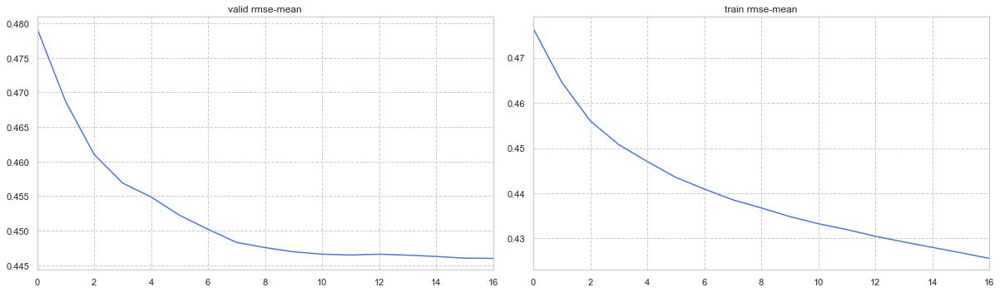


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('l1', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's train l1: 0.38271 + 0.00180731	cv_agg's valid l2: 0.198944 + 0.00400309	cv_agg's valid l1: 0.401154 + 0.00478475


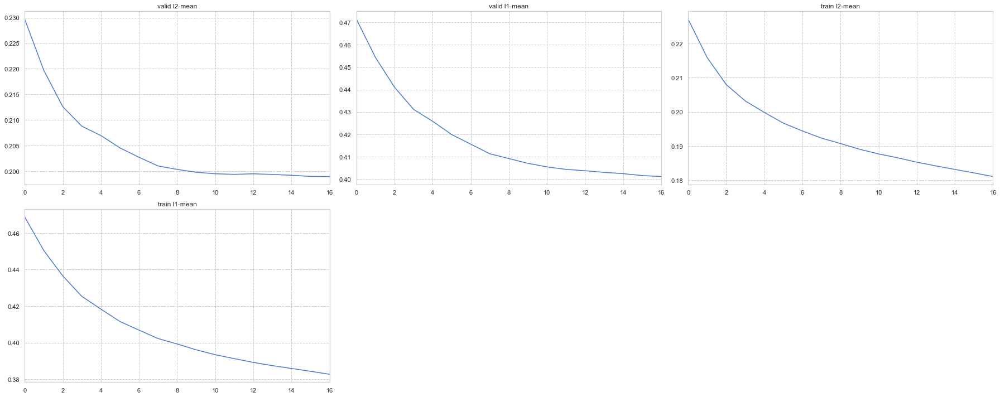


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('l2', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l1: 0.401154 + 0.00478475	cv_agg's valid l2: 0.198944 + 0.00400309


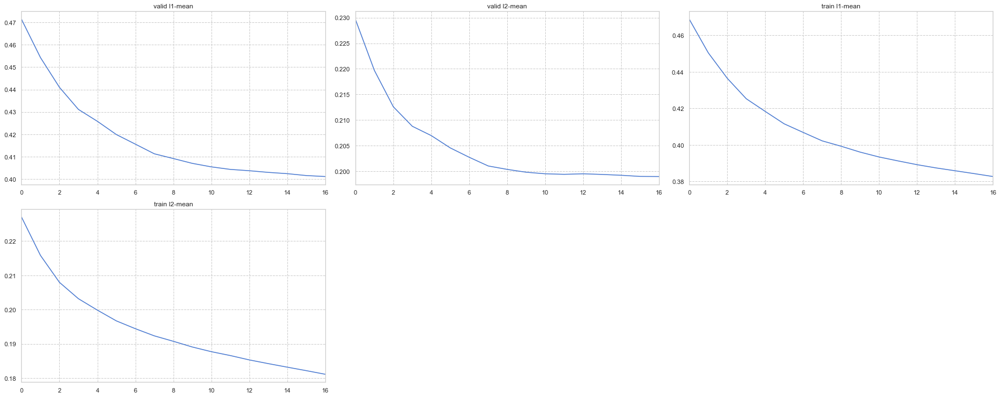


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('l1', 'l2', 'rmse')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.001027

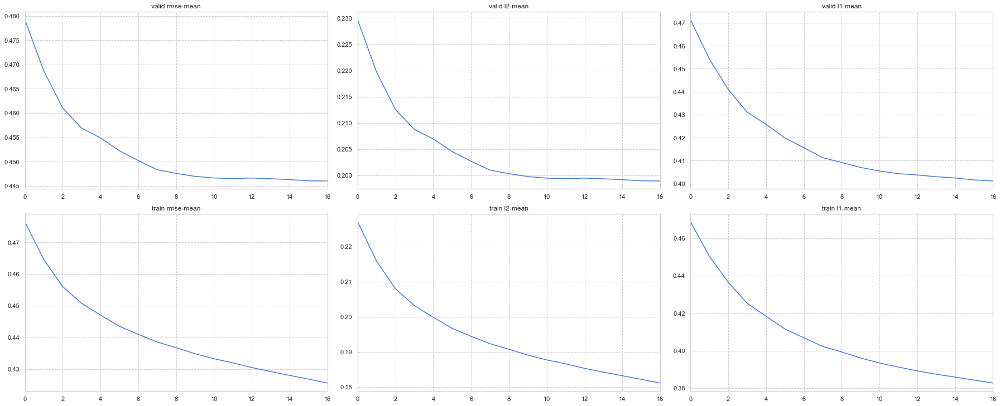


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('l1', 'rmse', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l1: 0.394692 + 0.00291469
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619

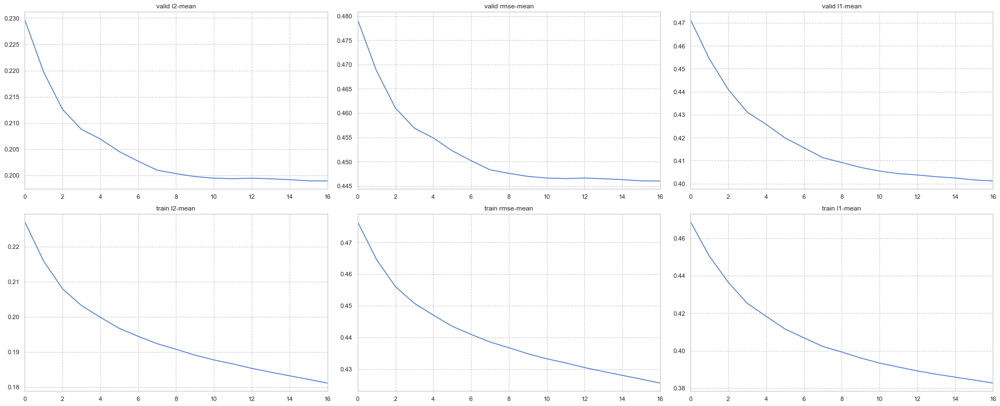


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('l2', 'l1', 'rmse')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.001027

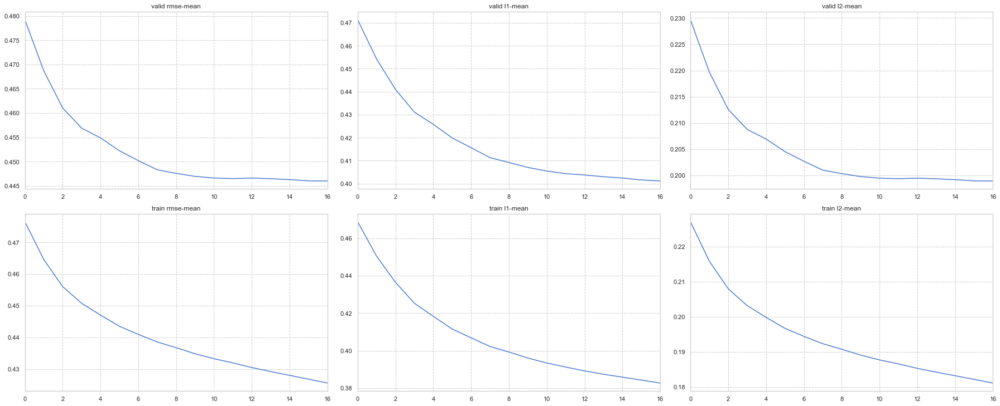


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('l2', 'rmse', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	

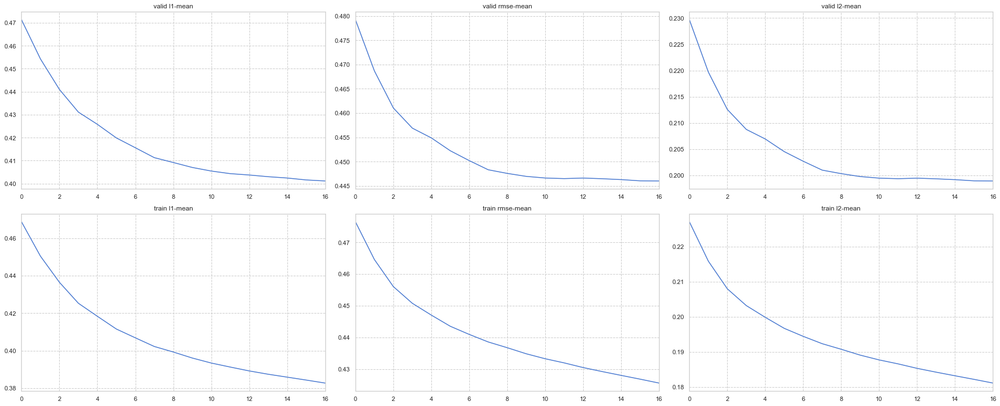


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('rmse', 'l1', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619

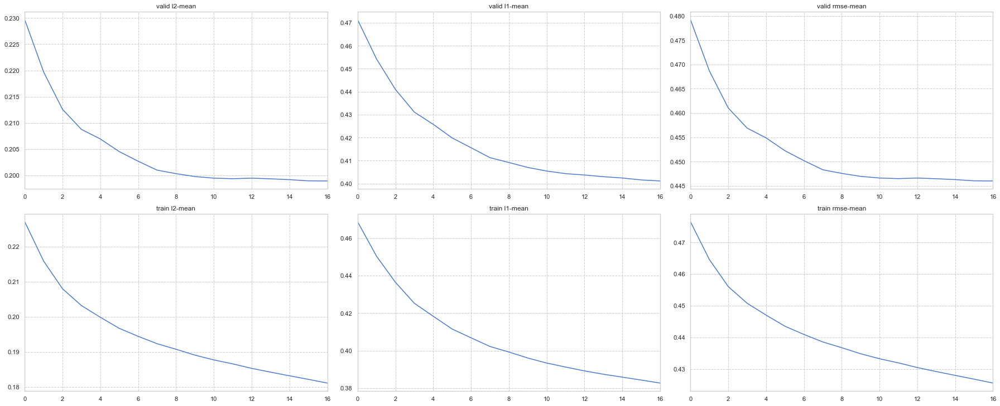


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ('rmse', 'l2', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	

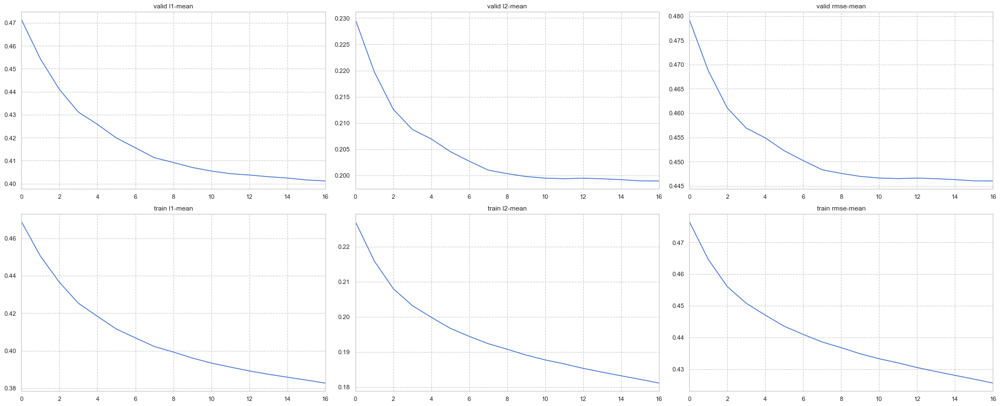


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309


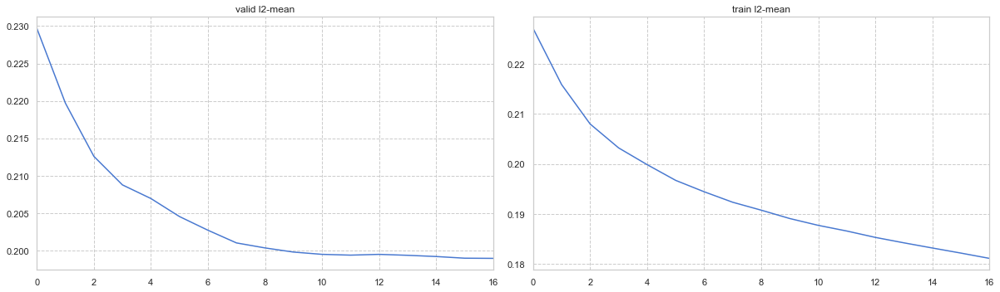


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309


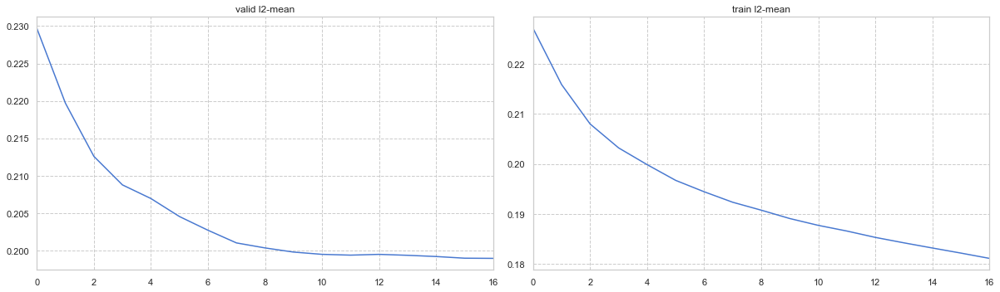


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'None'}

{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'l1'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-36-d38db90cb235>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-33-589a64a60485>", line 44, in regression_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train l1: 0.296659 + 0.00196172	cv_agg's valid l1: 0.395996 + 0.00343599
[150]	cv_agg's train l1: 0.280029 + 0.00192059	cv_agg's valid l1: 0.39735 + 0.00318484
Early stopping, best iteration is:
[68]	cv_agg's train l1: 0.330498 + 0.00213712	cv_agg's valid l1: 0.393031 + 0.00319347


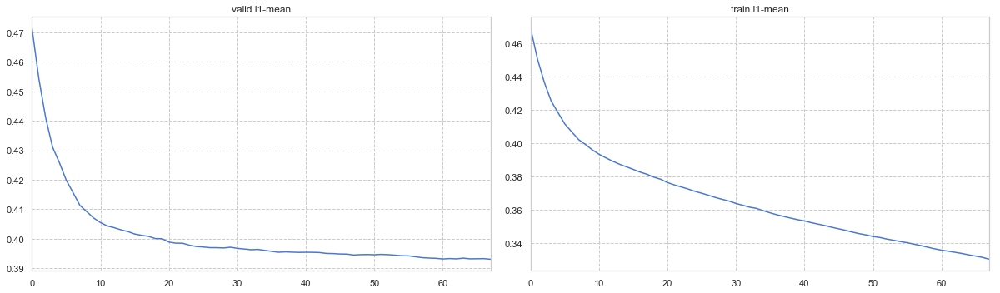


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'l2'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309


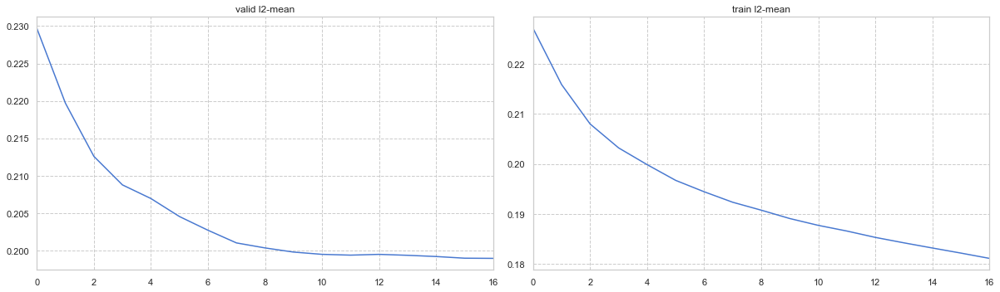


{'eval_train_metric': True, 'first_metric_only': False, 'metric_list': 'rmse'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.00102774	cv_agg's valid rmse: 0.446009 + 0.00448162


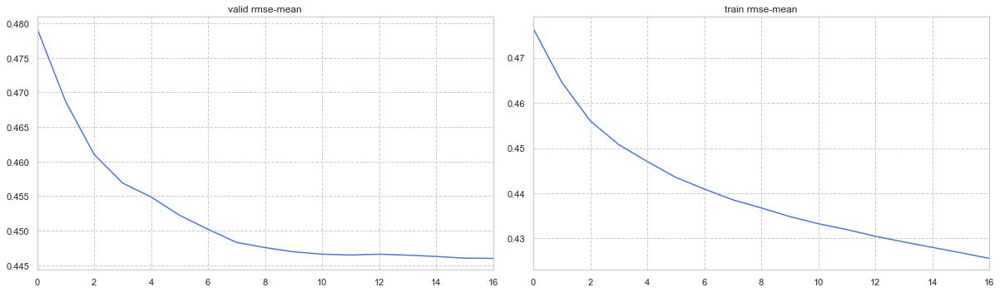


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('l1', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train l2: 0.122033 + 0.00108333	cv_agg's train l1: 0.296659 + 0.00196172	cv_agg's valid l2: 0.213233 + 0.00281925	cv_agg's valid l1: 0.395996 + 0.00343599
[150]	cv_agg's train l2: 0.110439 + 0.00116102	cv_agg's train l1: 0.280029 + 0.00192059	cv_agg's valid l2: 0.216656 + 0.00209944	cv_agg's valid l1: 0.39735 + 0.00318484
Early

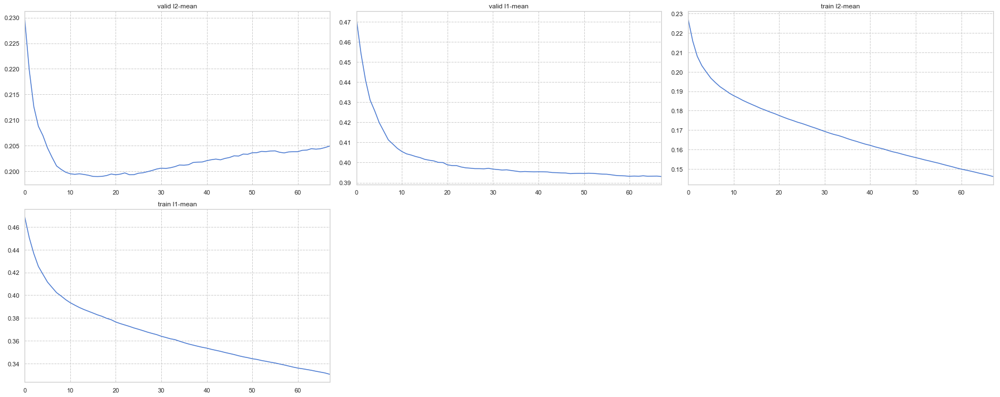


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('l2', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l1: 0.401154 + 0.00478475	cv_agg's valid l2: 0.198944 + 0.00400309
metric_key:valid l2


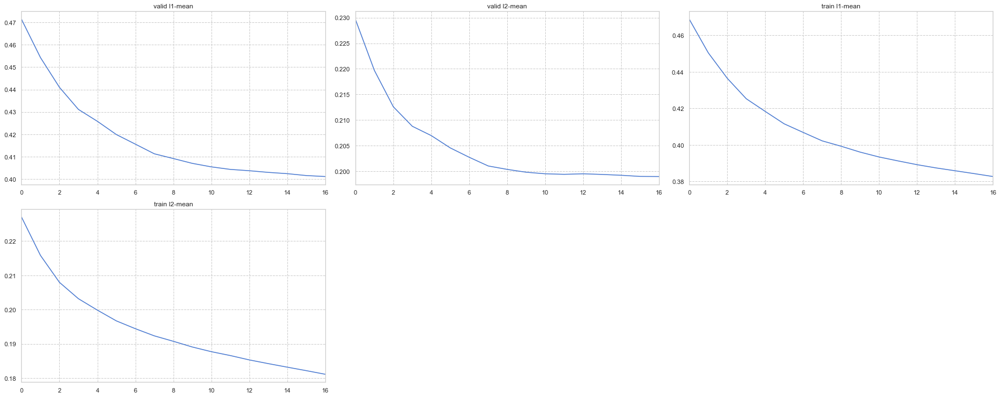


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('l1', 'l2', 'rmse')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train rmse: 0.349329 + 0.00155094	cv_agg's train l2: 0.122033 + 0

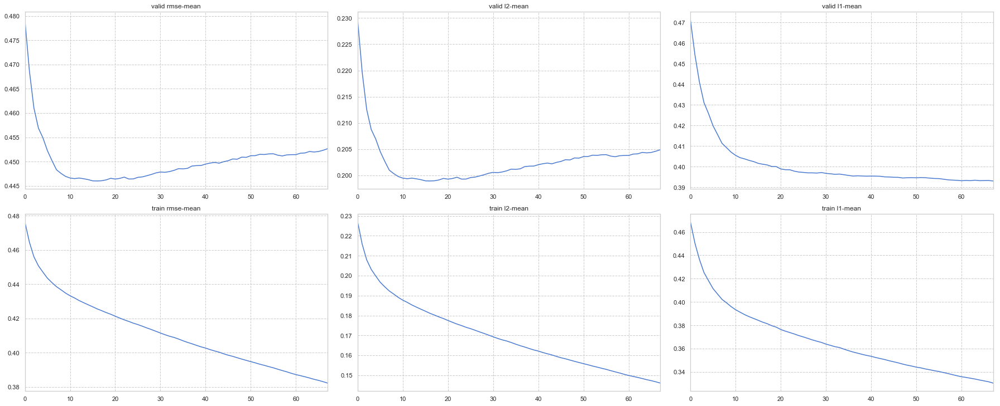


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('l1', 'rmse', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train l2: 0.122033 + 0.00108333	cv_agg's train rmse: 0.349329 + 0

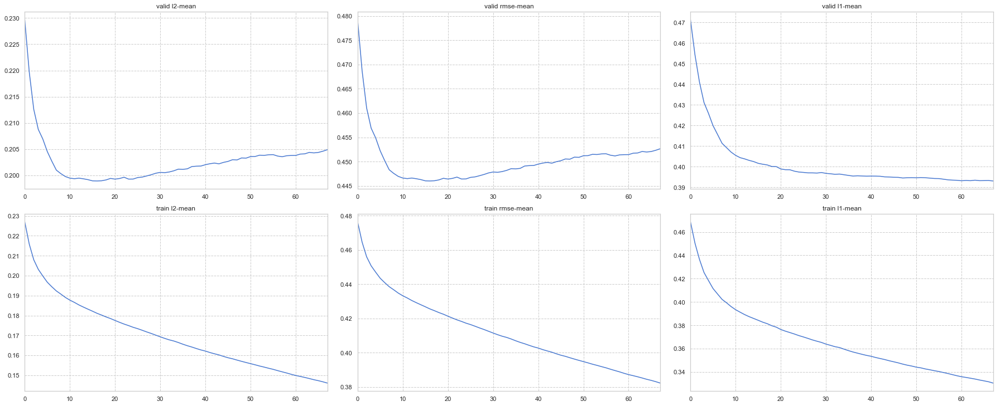


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('l2', 'l1', 'rmse')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.001027

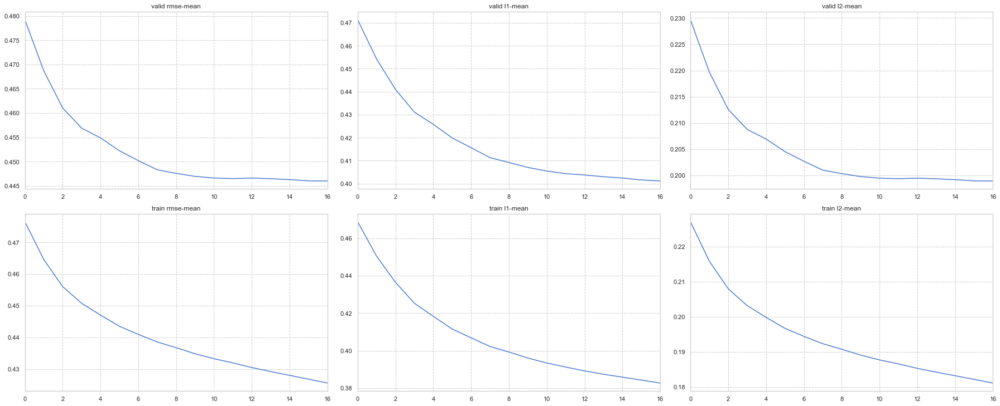


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('l2', 'rmse', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	

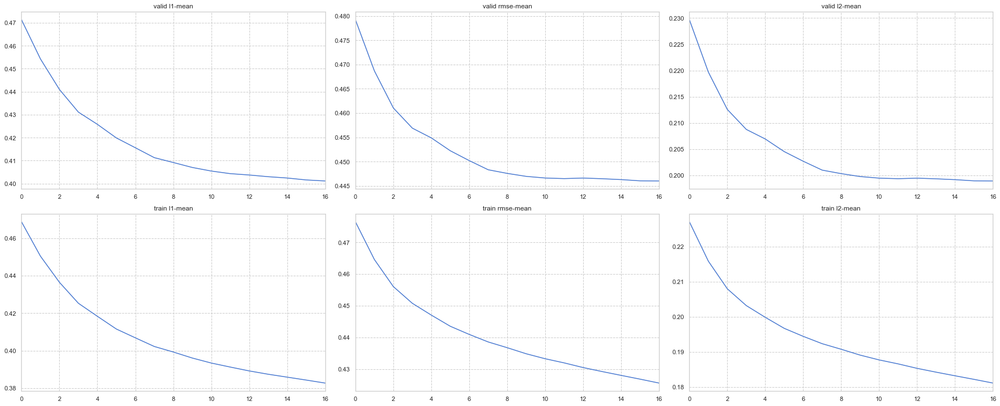


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('rmse', 'l1', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619

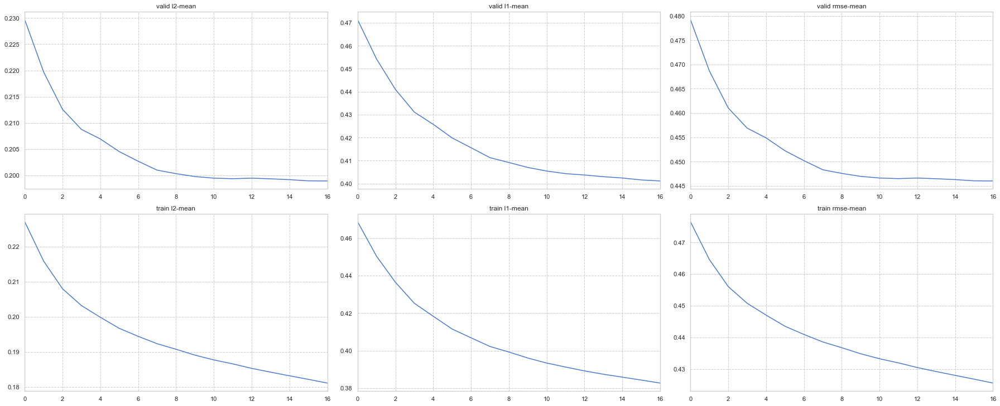


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ('rmse', 'l2', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	

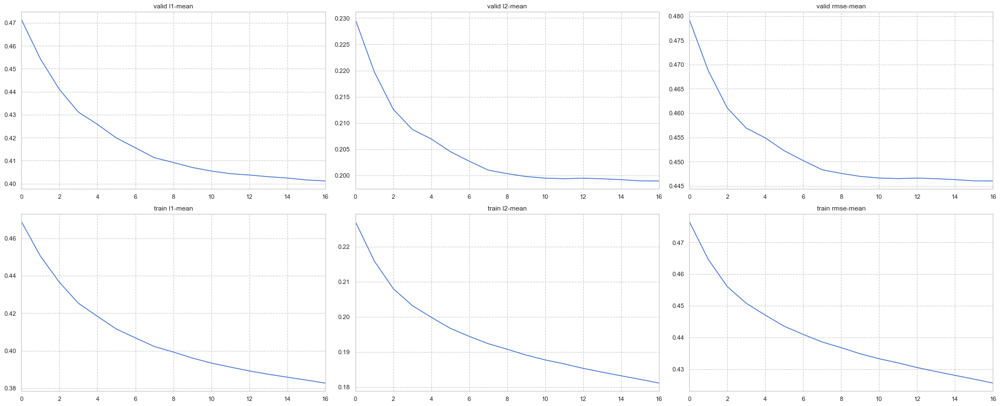


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.

{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-36-d38db90cb235>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-33-589a64a60485>", line 44, in regression_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 228, in _callback
    raise LightGBMError("`metric` should be specified if first_metric_only==True.")
lightgbm.basic.LightGBMError: `metric` should be specified if first_metric_only==True.


[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309
metric_key:valid l2


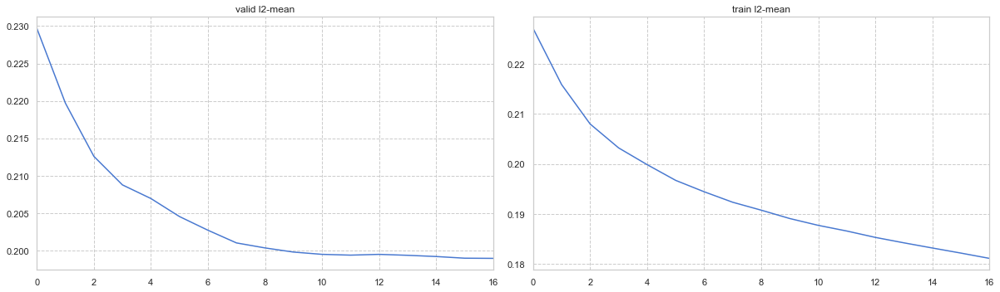


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'None'}

{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'l1'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-36-d38db90cb235>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-33-589a64a60485>", line 44, in regression_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train l1: 0.296659 + 0.00196172	cv_agg's valid l1: 0.395996 + 0.00343599
[150]	cv_agg's train l1: 0.280029 + 0.00192059	cv_agg's valid l1: 0.39735 + 0.00318484
Early stopping, best iteration is:
[68]	cv_agg's train l1: 0.330498 + 0.00213712	cv_agg's valid l1: 0.393031 + 0.00319347
metric_key:valid l1


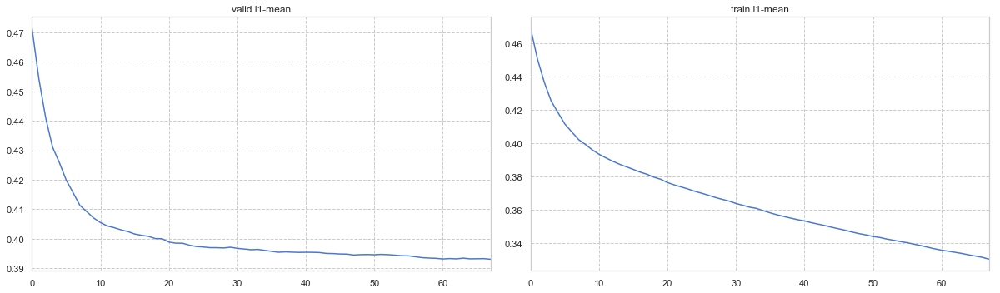


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'l2'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309
metric_key:valid l2


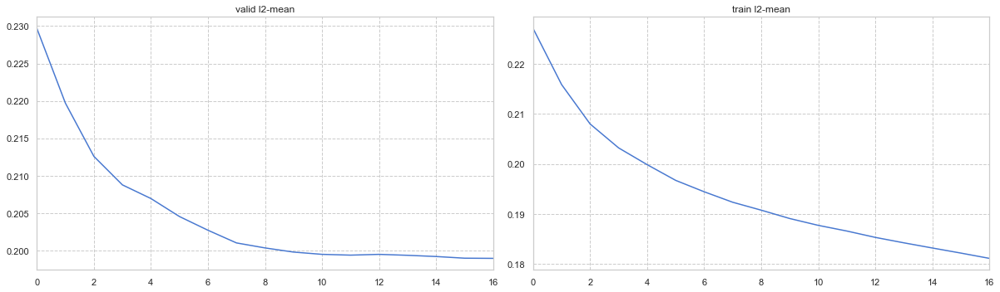


{'eval_train_metric': False, 'first_metric_only': True, 'metric_list': 'rmse'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.00102774	cv_agg's valid rmse: 0.446009 + 0.00448162
metric_key:valid rmse


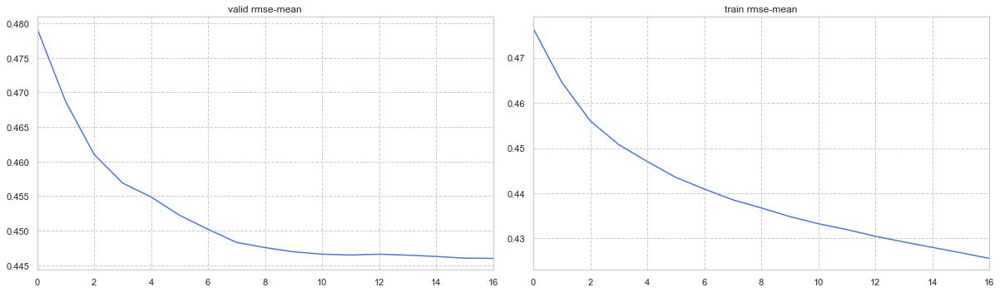


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('l1', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's train l1: 0.38271 + 0.00180731	cv_agg's valid l2: 0.198944 + 0.00400309	cv_agg's valid l1: 0.401154 + 0.00478475


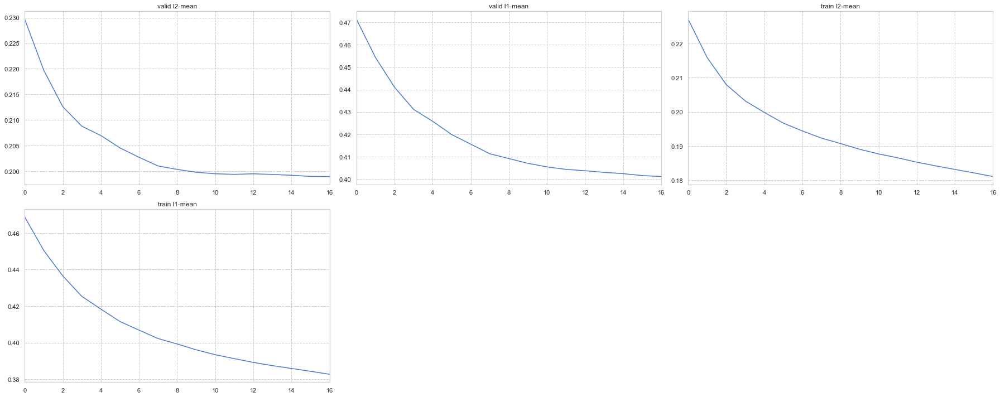


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('l2', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l1: 0.401154 + 0.00478475	cv_agg's valid l2: 0.198944 + 0.00400309


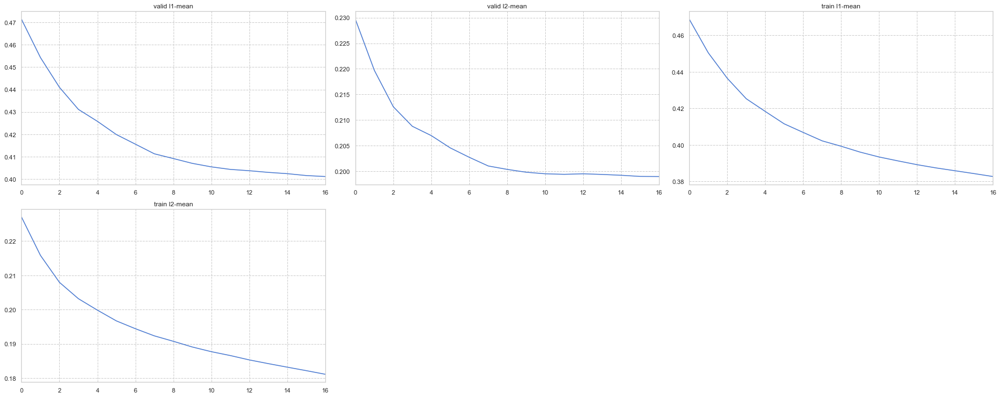


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('l1', 'l2', 'rmse')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.00102

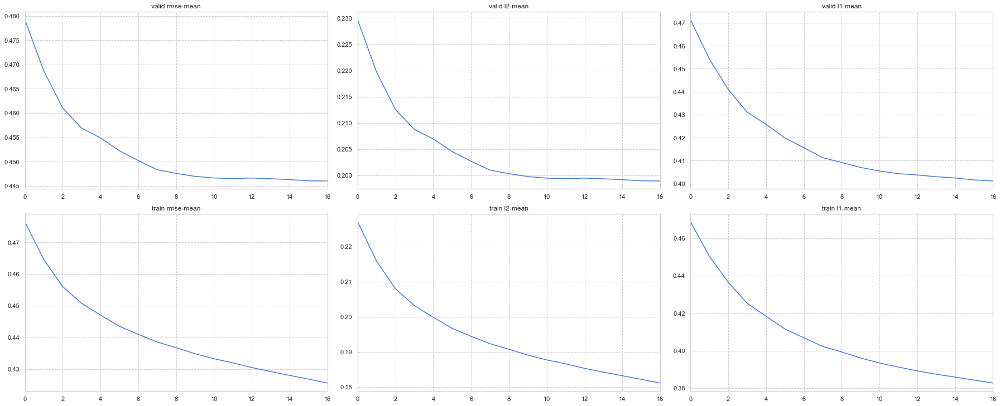


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('l1', 'rmse', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l1: 0.394692 + 0.00291469
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.00087461

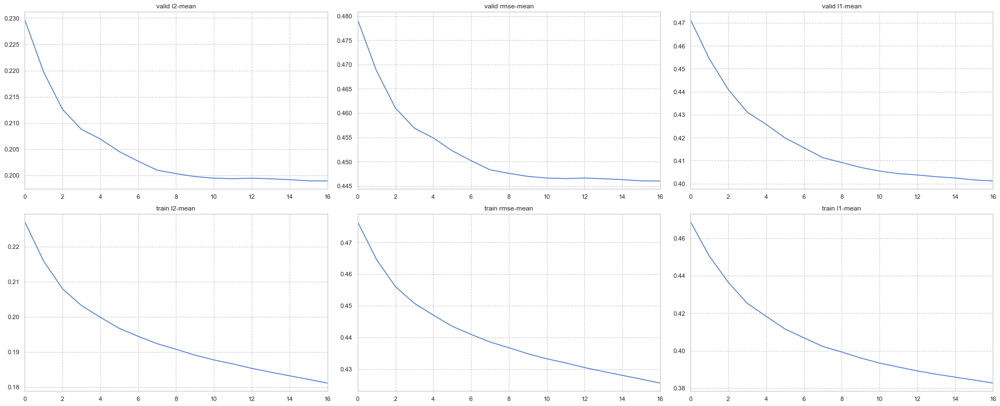


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('l2', 'l1', 'rmse')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.00102

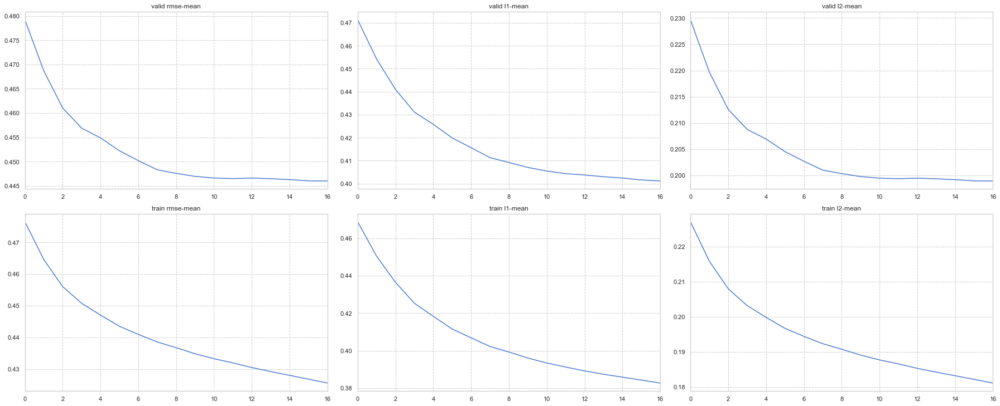


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('l2', 'rmse', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid rmse: 0.447665 + 0.0026799	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid rmse: 0.45143 + 0.00297996	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid rmse: 0.457062 + 0.00303972	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731

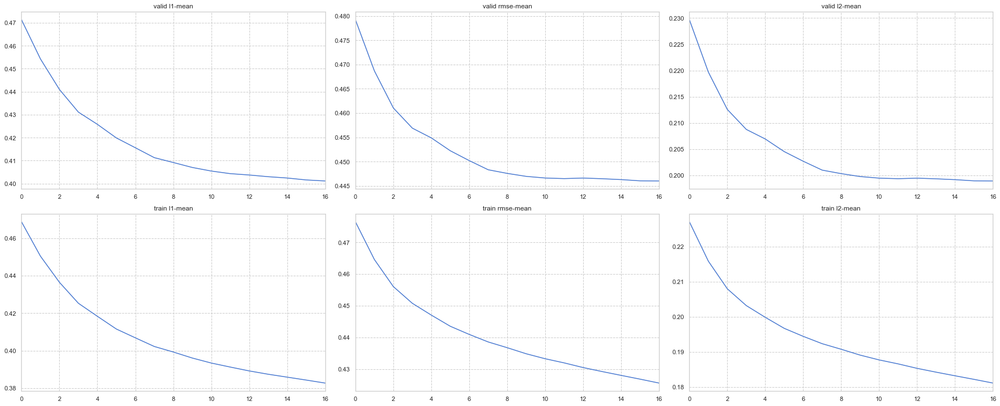


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('rmse', 'l1', 'l2')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.00087461

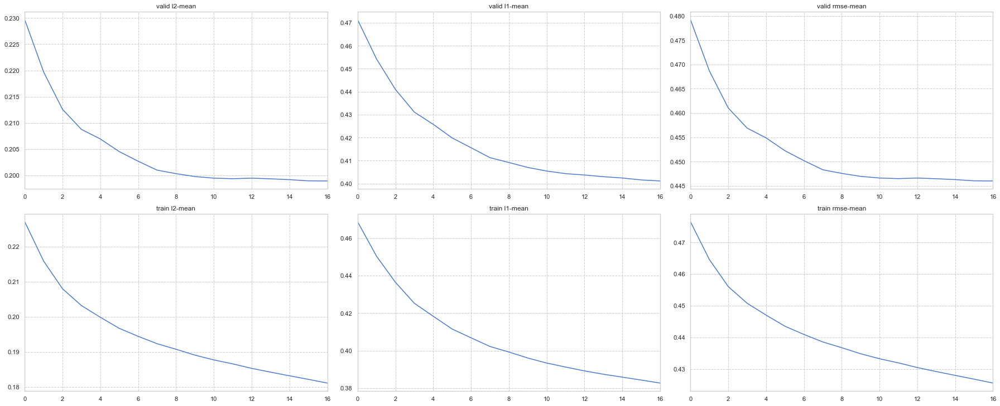


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ('rmse', 'l2', 'l1')}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid l1: 0.397114 + 0.00305829	cv_agg's valid l2: 0.200411 + 0.002401	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid l1: 0.393348 + 0.00251237	cv_agg's valid l2: 0.203798 + 0.00269383	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid l1: 0.394692 + 0.00291469	cv_agg's valid l2: 0.208915 + 0.00278042	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train l1: 0.38271 + 0.00180731

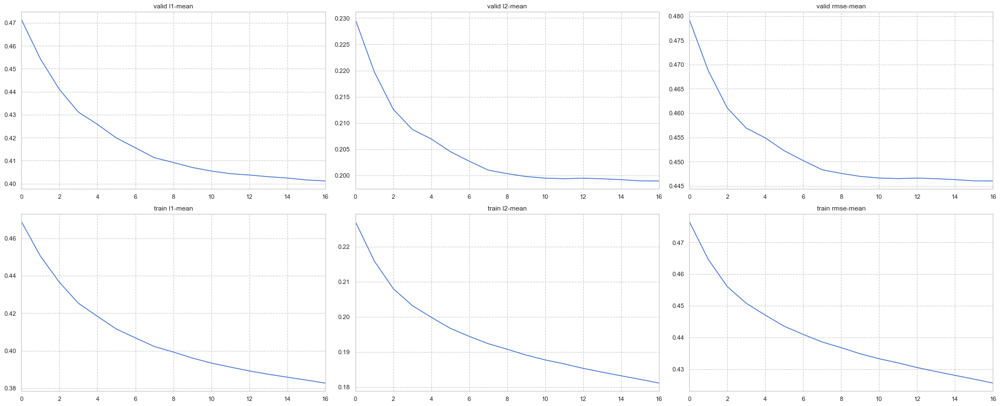


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': None}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309


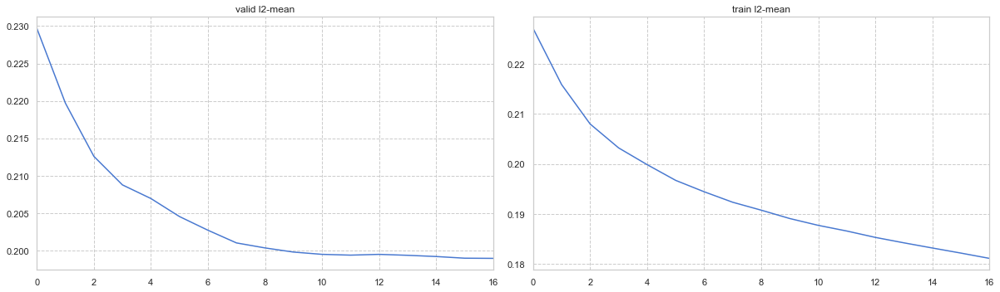


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': ''}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309


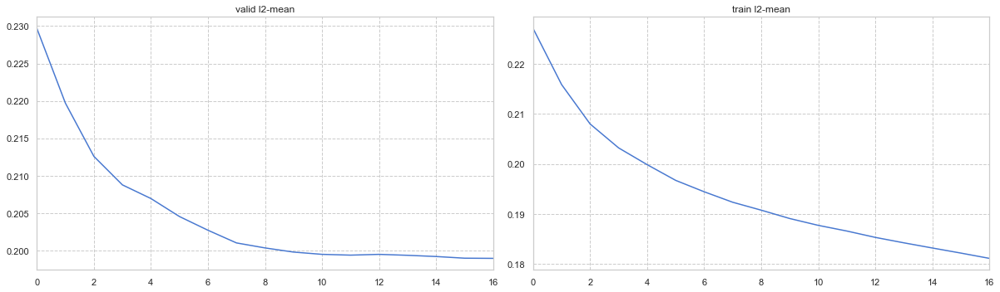


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': 'None'}

{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': 'l1'}
Training until validation scores don't improve for 100 rounds.


Traceback (most recent call last):
  File "<ipython-input-36-d38db90cb235>", line 10, in <module>
    num_boost_round=num_boost_round)
  File "<ipython-input-33-589a64a60485>", line 44, in regression_train
    eval_train_metric=eval_train_metric,
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/engine.py", line 514, in cv
    evaluation_result_list=res))
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 215, in _callback
    _init(env)
  File "/Users/kenichi.matsui/Documents/996_github/LightGBM/python-package/lightgbm/callback.py", line 196, in _init
    raise ValueError('For early stopping, '
ValueError: For early stopping, at least one dataset and eval metric is required for evaluation


[30]	cv_agg's train l1: 0.365335 + 0.00176749	cv_agg's valid l1: 0.397114 + 0.00305829
[60]	cv_agg's train l1: 0.336772 + 0.00186777	cv_agg's valid l1: 0.393348 + 0.00251237
[90]	cv_agg's train l1: 0.315529 + 0.00174053	cv_agg's valid l1: 0.394692 + 0.00291469
[120]	cv_agg's train l1: 0.296659 + 0.00196172	cv_agg's valid l1: 0.395996 + 0.00343599
[150]	cv_agg's train l1: 0.280029 + 0.00192059	cv_agg's valid l1: 0.39735 + 0.00318484
Early stopping, best iteration is:
[68]	cv_agg's train l1: 0.330498 + 0.00213712	cv_agg's valid l1: 0.393031 + 0.00319347


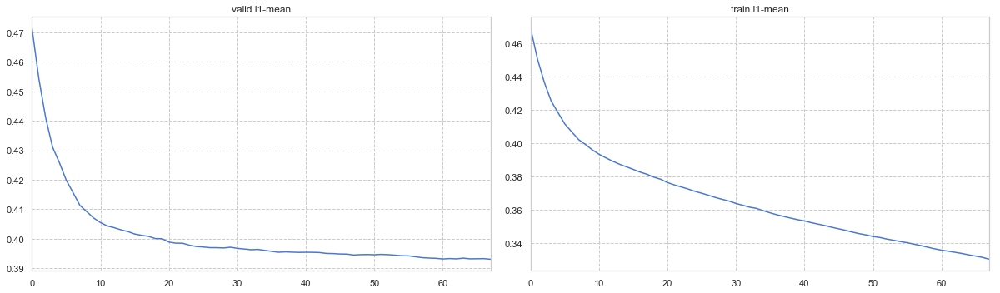


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': 'l2'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train l2: 0.170143 + 0.00111771	cv_agg's valid l2: 0.200411 + 0.002401
[60]	cv_agg's train l2: 0.150475 + 0.000866427	cv_agg's valid l2: 0.203798 + 0.00269383
[90]	cv_agg's train l2: 0.135389 + 0.000850166	cv_agg's valid l2: 0.208915 + 0.00278042
Early stopping, best iteration is:
[17]	cv_agg's train l2: 0.18111 + 0.000874619	cv_agg's valid l2: 0.198944 + 0.00400309


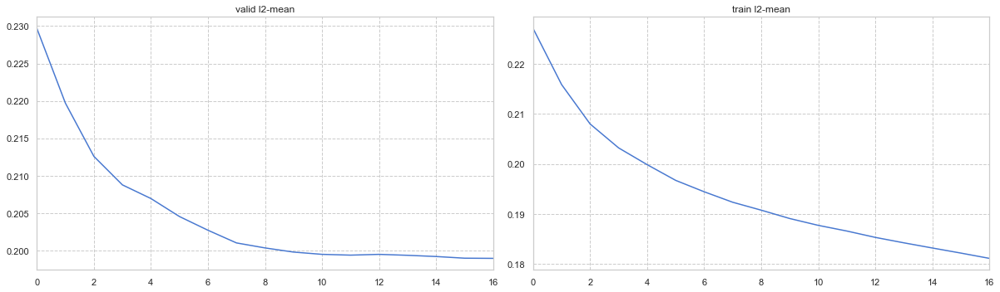


{'eval_train_metric': False, 'first_metric_only': False, 'metric_list': 'rmse'}
Training until validation scores don't improve for 100 rounds.
[30]	cv_agg's train rmse: 0.412481 + 0.00135635	cv_agg's valid rmse: 0.447665 + 0.0026799
[60]	cv_agg's train rmse: 0.387909 + 0.00111695	cv_agg's valid rmse: 0.45143 + 0.00297996
[90]	cv_agg's train rmse: 0.367951 + 0.00115597	cv_agg's valid rmse: 0.457062 + 0.00303972
Early stopping, best iteration is:
[17]	cv_agg's train rmse: 0.425569 + 0.00102774	cv_agg's valid rmse: 0.446009 + 0.00448162


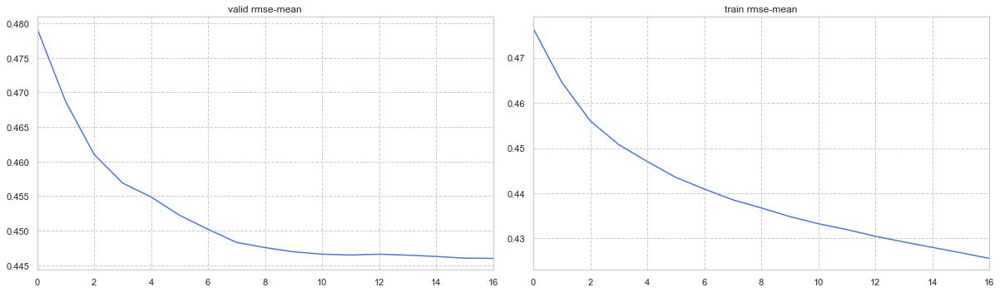

In [36]:
num_boost_round = 300
for p in pg:
    print("="*100, flush=True)
    print("="*100, flush=True)
    print(p, flush=True)
    try:
        df_ret = regression_train(metric_list=p["metric_list"], 
                             eval_train_metric=p["eval_train_metric"], 
                             first_metric_only=p["first_metric_only"],
                             num_boost_round=num_boost_round)
        draw_metric_graph(df_ret)
        if df_ret.shape[0]==num_boost_round:
            raise Exception("early_stopping was not applied.")
    except Exception as e:
        traceback.print_exc()
        
    print("", flush=True)
    # break

# sandbox

In [ ]:
# create dataset for lightgbm
lgb_train = lgb.Dataset(X_train, y_train)

# specify your configurations as a dict
params = {
    'boosting_type': 'gbdt',
    'objective': 'binary',
    'metric': ['binary_logloss','auc', ],
    #'metric': ['auc', 'binary_logloss',],
    'num_leaves': 8,
    'learning_rate': 0.1,
    'feature_fraction': 0.8,
    'bagging_fraction': 0.8,
    'bagging_freq': 5,
    'verbose': 0
}

res_dict = {}
callbacks = [
    lgb.early_stopping(stopping_rounds=100, first_metric_only=True, verbose=True),
    #lgb.record_evaluation(res_dict)
]

# Training settings
FOLD_NUM = 5
fold_seed = 71
folds = StratifiedKFold(n_splits=FOLD_NUM, shuffle=True, random_state=fold_seed)

# Fitting
ret = lgb.cv(params=params,
               train_set=lgb_train,
               folds=folds,
               num_boost_round=5000,
               verbose_eval = 10,
               callbacks=callbacks, 
               eval_train_metric=True,
               # return_boosters=True
               )

#print(f"best_iteration : {model.best_iteration}")
df_ret = pd.DataFrame(ret)
df_ret.tail()

oof = model.get_oof_prediction()
print(f"roc_auc_score on oof preds: {roc_auc_score(lgb_train.label, oof)}")

test_preds_list = model.predict(X_test, num_iteration=model.best_iteration)
test_preds_avg = np.array(test_preds_list).mean(axis=0)

print(f"roc_auc_score on oof preds: {roc_auc_score(y_test, test_preds_avg)}")

In [ ]:
rd.seed(123)

# Loading Iris Dataset
iris = datasets.load_iris()
X, y = iris.data, iris.target

# Split dataset for this demonstration.
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                shuffle=True,
                                                random_state=42)

# one hot representation of y_train
max_class_num = y_train.max()+1
y_train_ohe = np.identity(max_class_num)[y_train]
    
# Create LightGBM dataset for train.
lgb_train = lgb.Dataset(X_train, y_train, free_raw_data=False)

# LightGBM parameter
params = {
    'boosting_type': 'gbdt',
    'objective': 'multiclass',
    'metric' : ["multi_logloss", "multi_error", ],
    'num_class': 3,
    'verbosity' : -1,
}
callbacks = [
    lgb.early_stopping(stopping_rounds=100, first_metric_only=False, verbose=True),
]

# Training settings
FOLD_NUM = 5
fold_seed = 71
folds = StratifiedKFold(n_splits=FOLD_NUM, shuffle=True, random_state=fold_seed)
eval_train_metric=True
# # Fitting
ret, model = lgb.cv(params=params,
               train_set=lgb_train,
               folds=folds,
               num_boost_round=1000,
               verbose_eval = 30,
               callbacks=callbacks, 
               eval_train_metric=eval_train_metric,
               return_boosters=True
               )

print(f"best_iteration : {model.best_iteration}")
df_ret = pd.DataFrame(ret)
df_ret.tail()

In [ ]:
oof = model.get_oof_prediction()

print(f"accuracy on oof preds: {accuracy_score(lgb_train.label, np.argmax(oof, axis=1))}")

test_preds_list = model.predict(X_test, num_iteration=model.best_iteration)
test_preds_avg = np.array(test_preds_list).mean(axis=0)
test_preds = np.argmax(test_preds_avg, axis=1)

print(f"accuracy on oof preds: {accuracy_score(y_test, test_preds)}")

In [ ]:
lgb_train = lgb.Dataset(X_train, y_train)

params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'learning_rate': 0.05,
    'num_leaves': 5,
    'metric': ['l1', 'l2'],
    'verbose': -1
}

callbacks = [
    lgb.early_stopping(stopping_rounds=100, first_metric_only=False, verbose=True),
]

# Training settings
FOLD_NUM = 5
fold_seed = 71
folds = StratifiedKFold(n_splits=FOLD_NUM, shuffle=True, random_state=fold_seed)
eval_train_metric=True
# # Fitting
ret, model = lgb.cv(params=params,
               train_set=lgb_train,
               folds=folds,
               num_boost_round=5000,
               verbose_eval = 200,
               callbacks=callbacks, 
               eval_train_metric=eval_train_metric,
               return_boosters=True
               )
print(f"best_iteration : {model.best_iteration}")

df_ret = pd.DataFrame(ret)
df_ret.tail()

In [ ]:
oof = model.get_oof_prediction()
print(f"mae: {mean_absolute_error(y_train, oof):.5f}")
test_preds_list = model.predict(X_test, num_iteration=model.best_iteration)
test_preds_avg = np.array(test_preds_list).mean(axis=0)